#**Modeling Short-Terms Returns for an ETF**

In this Python notebook, we will build a model to predict short term returns (daily return direction) for the Vanguard 500 Index Fund ETF, using ~10 years of historical data, following the 7-step ML model building process.

# **I. Ideation**

**About the data:**
Vanguard 500 ETF invests in stocks in the S&P 500 Index, representing 500 of the largest U.S. companies. Its goal is to closely track the index’s return, which is considered a gauge of overall U.S. stock returns.

**What do we want to predict:**
We want to build an ensemble model which predicts whether the fund returns will increase or decrease on a daily basis.

**How will we make this prediction:**
Using the 7 step ML model building pipeline described as follows:

|Steps	|Workflow	|Remarks |
| --- | --- | --- |
|Step 1	|Data Collection	|Loaded the historical data from Yahoo Finance |
|Step 2	|Feature Engineering	|Extended the feature set available by default from Yahoo Finance |
|Step 3	|Exploratory Data Analysis	|Studied summary statistics |
|Step 4	|Data Cleaning and Imputation	|Data obtained was relatively clean, no further imputations required |
|Step 5	|Feature Transformation	|Extracted new features, dropped features, and created feature and target datasets |
|Step 6	|Model Building and Optimization	|Built and trained an ensemble model |
|Step 7	|Model Evaluation and Backtesting	|Validated and studied the model performance using various performance metrics |

###Import libraries

In [92]:
# Yahoo Finance libraries to pull up-to-date ticker data
try:
  import yfinance as yf
except:
  # install a library
  !pip install yfinance --upgrade --no-cache-dir
  import yfinance as yf

In [93]:
# Yahoo Finance libraries to pull up-to-date ticker data
try:
  import yahoo_fin
  from yahoo_fin import stock_info as si
except:
  # install a library
  !pip install yahoo_fin
  import yahoo_fin
  from yahoo_fin import stock_info as si

In [94]:
# Financial indicators
try:
  import pandas_ta as ta
except:
  # install a library
  !pip install pandas_ta
  import pandas_ta as ta

In [95]:
# Base Libraries
import pandas as pd
import numpy as np
from tqdm import tqdm
from functools import partial

In [96]:
# Graphs
%matplotlib inline
import matplotlib.pyplot as plt
width, height = 15, 6
plt.rcParams['figure.figsize'] = [width, height]
plt.style.use('fivethirtyeight')

In [97]:
# ML Libraries

# Preprocessing
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV, cross_val_score

# Models
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

# Kernels
from sklearn.gaussian_process.kernels import RBF
from sklearn.gaussian_process.kernels import DotProduct
from sklearn.gaussian_process.kernels import Matern
from sklearn.gaussian_process.kernels import RationalQuadratic
from sklearn.gaussian_process.kernels import WhiteKernel

# Ensemble types
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier
from xgboost import XGBClassifier

# Classification metrics
from sklearn.metrics import RocCurveDisplay, ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [98]:
# Financial Portfolio Profiling
try:
  import quantstats as qs
except:
  # install a library
  !pip install quantstats
  import quantstats as qs


In [99]:
# Hyper-parameter tuning and experiment tracking
try:
  import optuna
except:
  # install a library
  !pip install optuna
  import optuna

# **II. Model Building**

## 1. Data Collection

###Read data

#### Some useful functions

These functions can be used to refine the data pulling commands for the YFinance and YahooFin libraries, if US equity market tickers are being used for the analysis.

In [100]:
def getUsefulSymbolsSet(symbols):
  # Some stocks are 5 characters. Those stocks with the suffixes listed below are not of interest.
  suffix_notToUse = ['W', 'R', 'P', 'Q']
  del_set = set()
  sav_set = set()

  for symbol in symbols:
      if len( symbol ) > 4 and symbol[-1] in suffix_notToUse:
          del_set.add( symbol )
      else:
          sav_set.add( symbol )

  print( f'Removed {len( del_set )} unqualified stock symbols...' )
  print( f'There are {len( sav_set )} qualified stock symbols...' )

  return sav_set, del_set

In [101]:
# gather stock symbols from major US exchanges
df_SP = pd.DataFrame( si.tickers_sp500() )
df_NDQ = pd.DataFrame( si.tickers_nasdaq() )
df_DOW = pd.DataFrame( si.tickers_dow() )
df_Others = pd.DataFrame( si.tickers_other() )

# convert DataFrame to list, then to sets
sym_SP = set( symbol for symbol in df_SP[0].values.tolist() )
sym_NDQ = set( symbol for symbol in df_NDQ[0].values.tolist() )
sym_DOW = set( symbol for symbol in df_DOW[0].values.tolist() )
sym_Others = set( symbol for symbol in df_Others[0].values.tolist() )

# join the 4 sets into one. Because it's a set, there will be no duplicate symbols
symbols = set.union( sym_SP, sym_NDQ, sym_DOW, sym_Others )

sav_Symbols, del_Symbols = getUsefulSymbolsSet( symbols )

Removed 725 unqualified stock symbols...
There are 10422 qualified stock symbols...


In [102]:
def getHistoricalTickerData(ticker, start, end):
  # Fetch the data by specifying the number of period
  df = yf.download( ticker, #'VOO',
                    start= start, #'2016-01-01',
                    progress=False,
                    end= end #'2022-10-28'
                   )

  print('Shape of raw df: ', df.shape)

  # Display the first five rows of the dataframe to check the results.
  print('First 5 rows in df: ')
  df.head()

  return df

#### Vanguard 500 ETF

For this analysis, as stated above, we proceed with Vanguard 500 ETF (ticker: VOO) as the asset of interest. The data is pulled for 10 years, from January 2013 to December 2023.

In [103]:
# Fetch the data by specifying the number of period
df = yf.download('VOO',
                  start='2013-01-01',
                  end='2023-12-31',
                  progress=False)

print('Shape of raw df: ', df.shape)

# Display the first five rows of the dataframe to check the results.
print('First 5 rows in df: ')
df.head()

Shape of raw df:  (2768, 6)
First 5 rows in df: 


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2013-01-02,132.940002,133.699997,132.559998,133.600006,109.463860,2166600
2013-01-03,133.639999,133.979996,133.039993,133.479996,109.365570,1146100
2013-01-04,133.619995,134.220001,133.360001,134.039993,109.824348,574300
2013-01-07,133.539993,133.779999,133.139999,133.679993,109.529442,598200
2013-01-08,133.440002,133.600006,132.759995,133.279999,109.201691,476100


In [104]:
df_safe = df.copy()

In [105]:
df.isnull().sum()

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

### Forward Log Returns

We define the returns for the ETF time series as the daily difference of the log adjusted closing prices.


In [106]:
df['Forward Returns'] = np.log(df['Adj Close']).diff().shift(-1)

df = df.dropna()
print('Shape of df with returns column added & NA dropped: ', df.shape)

print('First 5 rows in df with returns column added & NA dropped: ')
df.head()

Shape of df with returns column added & NA dropped:  (2767, 7)
First 5 rows in df with returns column added & NA dropped: 


,Open,High,Low,Close,Adj Close,Volume,Forward Returns
Date,,,,,,,
2013-01-02,132.940002,133.699997,132.559998,133.600006,109.463860,2166600,-0.000898
2013-01-03,133.639999,133.979996,133.039993,133.479996,109.365570,1146100,0.004186
2013-01-04,133.619995,134.220001,133.360001,134.039993,109.824348,574300,-0.002689
2013-01-07,133.539993,133.779999,133.139999,133.679993,109.529442,598200,-0.002997
2013-01-08,133.440002,133.600006,132.759995,133.279999,109.201691,476100,0.002997


In [107]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,Forward Returns
count,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2.767000e+03,2767.000000
mean,264.285649,265.666328,262.774193,264.326501,244.409206,3.047863e+06,0.000500
std,86.625780,87.218244,85.998197,86.642758,93.317394,2.322661e+06,0.010869
min,132.940002,133.600006,132.559998,133.279999,109.201691,2.597500e+05,-0.124870
25%,189.889999,190.850006,188.919998,190.014999,163.099312,1.529200e+06,-0.003572
50%,249.039993,250.660004,247.449997,248.789993,226.179565,2.532400e+06,0.000694
75%,349.779999,352.120010,347.205002,349.655014,338.771194,3.795650e+06,0.005668
max,440.579987,441.260010,437.660004,439.250000,437.970001,2.466930e+07,0.091087


###Binarizing Forward Returns

Next, we try to come up with an approach on how to categorise the forward log returns data into binary, and how to categorize extremely small near-zero returns.

The thresholds chosen should ideally depend on the statistical properties of the returns time series of the chosen ETF ticker (Vanguard 500 Index Fund).

####Statistical Properties

First, we check the distribution and statistical properties of the forward returns time series, with particular focus on small, near-zero returns values.

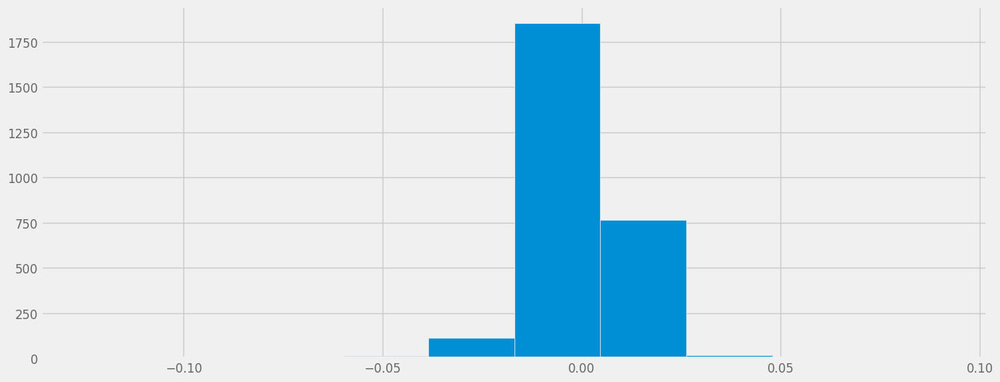

In [108]:
# check distribution of forward returns time series
check = df['Forward Returns']

plt.hist(check)
plt.show()

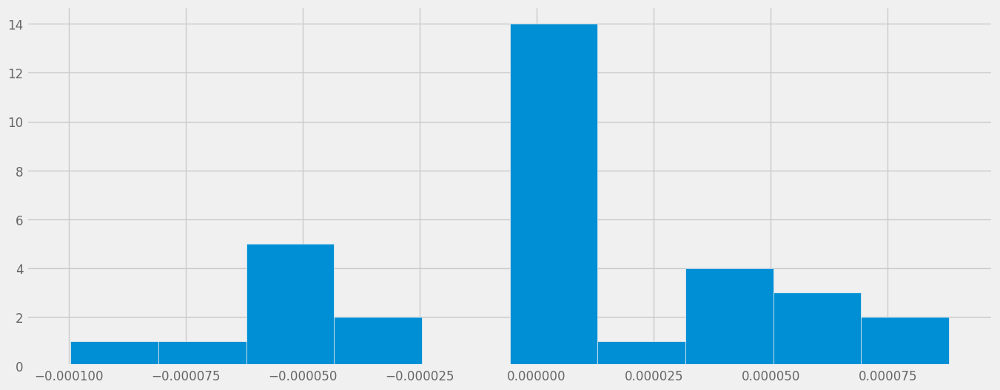

In [109]:
# check distribution of near-zero values (~1bp) in forward returns time series
plt.hist(check[np.abs(check) <= 0.0001])
plt.show()

In [110]:
print('Count of datapoints available for the target return: ', check.count(), '. Half of this: ', check.count()/2 )
print('Count of datapoints greater than 0 for the target return: ', check[check > 0].count() )
print('Count of datapoints less than 0.0001 in absolute terms for the target return: ', check[np.abs(check) <= 0.0001].count() )
print('Count of datapoints less than 0.00005 in absolute terms for the target return: ', check[np.abs(check) <= 0.00005].count() )
print('Count of datapoints greater than mean ', check.mean(), ' for the target return: ', check[check > check.mean()].count() )
print('Count of datapoints equal to min ', check.min(), ' for the target return: ', check[check == check.min()].count() )
print('Count of datapoints equal to max ', check.max(), ' for the target return: ', check[check == check.max()].count() )
print('\n')
print('Value of 25th quantile ', check.quantile(.25), ' for the target return; count of data: ', check[check > check.quantile(.25)].count()  )
print('Value of 50th quantile ', check.quantile(.5), ' for the target return; count of data:', check[check > check.quantile(.5)].count()  )
print('Value of 75th quantile ', check.quantile(.75), ' for the target return; count of data:', check[check > check.quantile(.75)].count()  )
print('\n')
print('Mean of forward returns: ', check.mean())
normed_mean = ( check.count()*check.mean() - check.min() - check.max() )/( check.count()-1 )
print('Mean of forward returns, excluding high volatility March 2020 period: ', normed_mean)

Count of datapoints available for the target return:  2767 . Half of this:  1383.5
Count of datapoints greater than 0 for the target return:  1510
Count of datapoints less than 0.0001 in absolute terms for the target return:  33
Count of datapoints less than 0.00005 in absolute terms for the target return:  23
Count of datapoints greater than mean  0.0005001376766908911  for the target return:  1426
Count of datapoints equal to min  -0.12486970392074337  for the target return:  1
Count of datapoints equal to max  0.09108659629824345  for the target return:  1


Value of 25th quantile  -0.003572158223644095  for the target return; count of data:  2075
Value of 50th quantile  0.000694163436317119  for the target return; count of data: 1383
Value of 75th quantile  0.005668350836725455  for the target return; count of data: 692


Mean of forward returns:  0.0005001376766908911
Mean of forward returns, excluding high volatility March 2020 period:  0.0005125321977679666


####Outliers

Next, we check the time series for outliers. We find that the outliers correspond to the peak covid time volatility in March 2020. We may choose to either drop this data completely or add dummy variables to capture this regime change.

Here, we make the design choice to neither drop these outliers nor to create any dummy variables.

In [111]:
top_5 = df.sort_values(by='Forward Returns', ascending=False).head()
print('Highest returns: \n')
top_5

Highest returns: 



,Open,High,Low,Close,Adj Close,Volume,Forward Returns
Date,,,,,,,
2020-03-23,209.630005,210.779999,200.550003,204.270004,192.386734,14128200,0.091087
2020-03-12,234.940002,243.679993,225.809998,226.479996,213.304642,24669300,0.089320
2020-04-03,230.429993,232.710007,225.339996,228.020004,214.755066,5490200,0.065807
2020-03-16,222.850006,234.770004,218.139999,218.570007,205.854828,17271500,0.063417
2020-03-25,225.000000,235.509995,220.320007,226.619995,213.436493,11876400,0.058364


<Axes: xlabel='Date'>

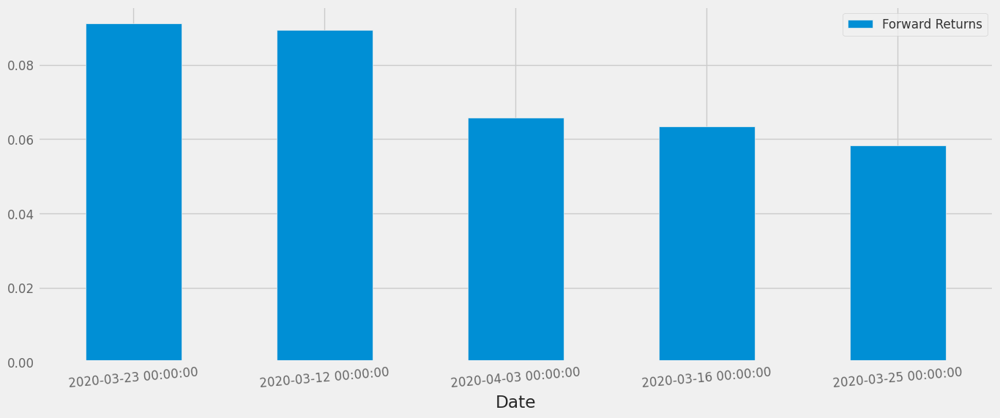

In [112]:
top_5.plot(y='Forward Returns', kind='bar', rot=5)

In [113]:
bottom_5 = df.sort_values(by='Forward Returns', ascending=True).head()
print('Lowest returns: \n')
bottom_5

Lowest returns: 



,Open,High,Low,Close,Adj Close,Volume,Forward Returns
Date,,,,,,,
2020-03-13,240.660004,247.779999,228.100006,247.639999,233.233688,19533600,-0.124870
2020-03-11,256.660004,257.720001,247.619995,250.729996,236.143936,11480100,-0.101720
2020-03-06,269.320007,274.459991,266.600006,273.190002,256.095093,6669100,-0.080302
2020-06-10,295.529999,296.390015,292.589996,293.220001,276.162140,5602600,-0.059364
2020-03-17,223.750000,233.949997,216.600006,232.880005,219.332352,15115500,-0.056214


<Axes: xlabel='Date'>

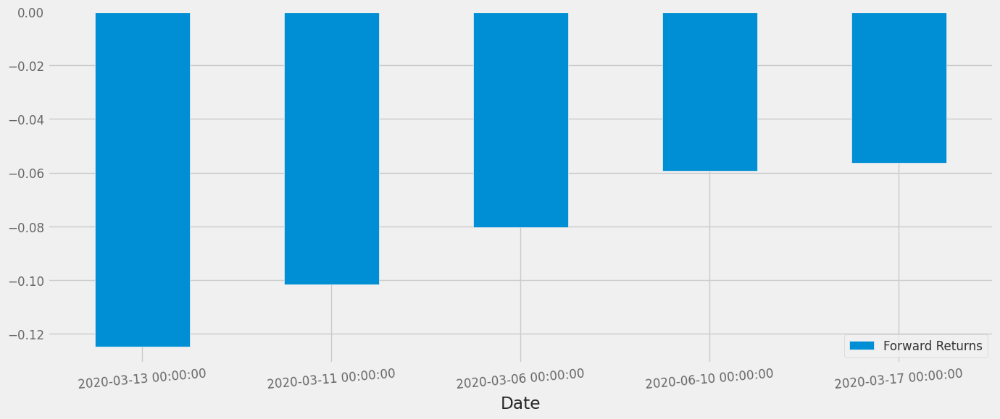

In [114]:
bottom_5.plot(y='Forward Returns', kind='bar', rot=5)

In [115]:
# df with these outliers in March 2020 dropped
# df_clean = df[ ~df[ (df.index.year == 2020) & (df.index.month == 3) ] ]

####Choosing binarization threshold


We can choose the returns binarization target threshold in multiple ways:
1. median for greater than consistent returns.
2. mean for greater than average returns.
3. normed_mean for greater than average returns excluding outlier returns.

Based on the analysis in the sections above, we choose to proceed with either normed mean (that is, mean that excludes the outliers) or 50th quantile as the threshold. The 50th quantile gives better class balance.

In [116]:
how = df['Forward Returns'].quantile(.5)
# how = df['Forward Returns'].mean()
# how = normed_mean

df['Target Returns'] = np.where( df['Forward Returns'] > how, 1, 0)
df.head()

,Open,High,Low,Close,Adj Close,Volume,Forward Returns,Target Returns
Date,,,,,,,,
2013-01-02,132.940002,133.699997,132.559998,133.600006,109.463860,2166600,-0.000898,0
2013-01-03,133.639999,133.979996,133.039993,133.479996,109.365570,1146100,0.004186,1
2013-01-04,133.619995,134.220001,133.360001,134.039993,109.824348,574300,-0.002689,0
2013-01-07,133.539993,133.779999,133.139999,133.679993,109.529442,598200,-0.002997,0
2013-01-08,133.440002,133.600006,132.759995,133.279999,109.201691,476100,0.002997,1


##2. Feature Engineering

#####Using common features:

We first create a few typically used features for algorithmic asset returns trend prediction.

In [117]:
target_feature = 'Close'

In [118]:
df['O-C'] = df['Open'] - df['Close']
df['C-C'] = df['Low'].diff().shift(-1)
df['O-O'] = df['Open'].diff().shift(-1)
df['H-L'] = df['High'] - df['Low'] # does the trend depend on vol? not really
# df.drop('Mean Scaled Volume', axis=1)

# Momentum may matter, though no seasonal behaviour is observed. Indicate whether long MA is above short MA
df['Momentum 6'] =  df[target_feature].diff().shift(-6)
df['Momentum 30'] =  df[target_feature].diff().shift(-30)

# Moving Averages
df['SMA'] = df[target_feature].rolling(30).mean()  # Should ideally pick one out of SMA and EMA

alpha = 2/( df[target_feature].count() + 1)
df['EMA'] = df[target_feature].ewm(alpha=alpha).mean()# Kind of a wted avg, more wt to near past, less wt to far past

In [119]:
# Sign of 1-day prior Close price daily log returns
df['Sign'] = np.sign(np.log(df[target_feature]).diff().shift(-1).shift(-1))

#####Using seasonality indicators:

In [120]:
# Seasonality indicators - one hot encoding, representing each month
df3 = pd.get_dummies(df.index.month)
df3.columns = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']
df3['Date'] = df.index
df3.set_index('Date', inplace=True)

df2 = pd.concat( [ df, df3 ], axis=1)
df = df2

#####Using lookbacks:

In [121]:
# Lagged returns may matter, since best predictor of a univariate time series is its own past behaviour. Note that no seasonal behaviour is observed
def laggedTimeSeries( lag = 6, target_feature = target_feature ):
  for i in range(1,lag+1):
    df[str('Lagged '+str(i))] =  df[target_feature].shift(-i)
laggedTimeSeries( lag = 6, target_feature = target_feature )

#####Using pandas-ta library:

In [122]:
df.ta.indicators()

Pandas TA - Technical Analysis Indicators - v0.3.14b0
Total Indicators & Utilities: 205
Abbreviations:
    aberration, above, above_value, accbands, ad, adosc, adx, alma, amat, ao, aobv, apo, aroon, atr, bbands, below, below_value, bias, bop, brar, cci, cdl_pattern, cdl_z, cfo, cg, chop, cksp, cmf, cmo, coppock, cross, cross_value, cti, decay, decreasing, dema, dm, donchian, dpo, ebsw, efi, ema, entropy, eom, er, eri, fisher, fwma, ha, hilo, hl2, hlc3, hma, hwc, hwma, ichimoku, increasing, inertia, jma, kama, kc, kdj, kst, kurtosis, kvo, linreg, log_return, long_run, macd, mad, massi, mcgd, median, mfi, midpoint, midprice, mom, natr, nvi, obv, ohlc4, pdist, percent_return, pgo, ppo, psar, psl, pvi, pvo, pvol, pvr, pvt, pwma, qqe, qstick, quantile, rma, roc, rsi, rsx, rvgi, rvi, short_run, sinwma, skew, slope, sma, smi, squeeze, squeeze_pro, ssf, stc, stdev, stoch, stochrsi, supertrend, swma, t3, td_seq, tema, thermo, tos_stdevall, trima, trix, true_range, tsi, tsignals, ttm_trend, ui, 

In [123]:
df.ta.ohlc4(append = True)

Date
2013-01-02    133.200001
2013-01-03    133.534996
2013-01-04    133.809998
2013-01-07    133.534996
2013-01-08    133.270000
                 ...    
2023-12-21    433.227501
2023-12-22    435.267502
2023-12-26    436.567505
2023-12-27    437.309998
2023-12-28    438.180000
Name: OHLC4, Length: 2767, dtype: float64

In [124]:
simpleStrategy = ta.Strategy(
    name = "addSimple",
    ta = [
        # {"kind": "ohlc4"},
        {"kind": "sma", "length":10},
        {"kind": "donchian", "lower_length":10, "upper_length":15},
        {"kind": "ema", "close":"ohlc4", "length":10, "suffix":"OLHC4"},
        {"kind": "tsi"},
        {"kind": "bbands"}
    ]
)

In [125]:
simpleExtendedStrategy = ta.Strategy(
    name = "addSimpleExtended",
    ta = [
        # {"kind": "ohlc4"},
        {"kind": "sma", "length":10},
        {"kind": "donchian", "lower_length":10, "upper_length":15},
        {"kind": "ema", "close":"ohlc4", "length":10, "suffix":"OLHC4"},
        {"kind": "tsi"},
        {"kind": "bbands"},

        {"kind": "fisher"},
        {"kind": "vwma"},
        {"kind": "vwap"},
        {"kind": "qqe"},
        {"kind": "quantile"},
        {"kind": "kurtosis"},
        {"kind": "variance"},
        {"kind": "skew"},
        {"kind": "rsi"},
        {"kind": "pvol"},
        {"kind": "squeeze"},
        {"kind": "short_run"}
    ]
)

In [126]:
complexStrategy = ta.Strategy(
    name = "addComplex",
    ta = [
        # {"kind": "ohlc4"},
        {"kind": "sma", "length":10},
        {"kind": "donchian", "lower_length":10, "upper_length":15},
        {"kind": "ema", "close":"ohlc4", "length":10, "suffix":"OLHC4"},
        {"kind": "tsi"},
        {"kind": "bbands"},

        {"kind": "fisher"},
        {"kind": "cross"},
        {"kind": "fwma"},
        {"kind": "hwma"},
        {"kind": "pwma"},
        {"kind": "swma"},
        {"kind": "vwma"},
        {"kind": "vwap"},
        {"kind": "qqe"},
        {"kind": "quantile"},
        {"kind": "kurtosis"},
        {"kind": "variance"},
        {"kind": "skew"},
        {"kind": "rsi"},
        {"kind": "pvol"},
        {"kind": "squeeze"},
        {"kind": "short_run"}
    ]
)

Choose one of the four methods below to create more features:

In [127]:
# Method 1
# df.ta.strategy(simpleStrategy)

In [128]:
# Method 2
# df.ta.strategy(simpleExtendedStrategy)

In [129]:
# Method 3
# df.ta.strategy(complexStrategy)

In [130]:
# Method 4
df.ta.strategy("All", timed = True)

0it [00:00, ?it/s]

[X] Please install TA-Lib to use 2crows. (pip install TA-Lib)
[X] Please install TA-Lib to use 3blackcrows. (pip install TA-Lib)
[X] Please install TA-Lib to use 3inside. (pip install TA-Lib)
[X] Please install TA-Lib to use 3linestrike. (pip install TA-Lib)
[X] Please install TA-Lib to use 3outside. (pip install TA-Lib)
[X] Please install TA-Lib to use 3starsinsouth. (pip install TA-Lib)
[X] Please install TA-Lib to use 3whitesoldiers. (pip install TA-Lib)
[X] Please install TA-Lib to use abandonedbaby. (pip install TA-Lib)
[X] Please install TA-Lib to use advanceblock. (pip install TA-Lib)
[X] Please install TA-Lib to use belthold. (pip install TA-Lib)
[X] Please install TA-Lib to use breakaway. (pip install TA-Lib)
[X] Please install TA-Lib to use closingmarubozu. (pip install TA-Lib)
[X] Please install TA-Lib to use concealbabyswall. (pip install TA-Lib)
[X] Please install TA-Lib to use counterattack. (pip install TA-Lib)
[X] Please install TA-Lib to use darkcloudcover. (pip instal

131it [00:12, 10.90it/s]

[i] Runtime: 12164.0371 ms (12.1640 s)


####Handling columns with excessive nulls

In [131]:
# Finding the null count per column

pd.DataFrame( zip(list(df.columns), list(df.isnull().sum())))

,0,1
0,Open,0
1,High,0
2,Low,0
3,Close,0
4,Adj Close,0
...,...,...
248,WCP,0
249,WILLR_14,13
250,WMA_10,9
251,ZL_EMA_10,9


In [132]:
# Dropping columns with more than 20 null values altogether

print(len(df.columns))

to_drop = list()
for col in df.columns:
  x = df[col].isnull().sum()
  if x > 20:
    to_drop.append(col)

print("These columns were dropped: {}".format(to_drop) )
df.drop(to_drop, axis=1, inplace=True)

253
These columns were dropped: ['Momentum 30', 'SMA', 'ADX_14', 'AO_5_34', 'APO_12_26', 'BIAS_SMA_26', 'AR_26', 'BR_26', 'open_Z_30_1', 'high_Z_30_1', 'low_Z_30_1', 'close_Z_30_1', 'CKSPl_10_3_20', 'CKSPs_10_3_20', 'COPC_11_14_10', 'EBSW_40_10', 'HILOl_13_21', 'HILOs_13_21', 'ISA_9', 'ISB_26', 'IKS_26', 'ICS_26', 'INERTIA_20_14', 'KST_10_15_20_30_10_10_10_15', 'KSTs_9', 'KURT_30', 'KVO_34_55_13', 'KVOs_34_55_13', 'MACD_12_26_9', 'MACDh_12_26_9', 'MACDs_12_26_9', 'MAD_30', 'MASSI_9_25', 'MEDIAN_30', 'PPO_12_26_9', 'PPOh_12_26_9', 'PPOs_12_26_9', 'PSARl_0.02_0.2', 'PSARs_0.02_0.2', 'PVO_12_26_9', 'PVOh_12_26_9', 'PVOs_12_26_9', 'QQE_14_5_4.236', 'QQEl_14_5_4.236', 'QQEs_14_5_4.236', 'QTL_30_0.5', 'SKEW_30', 'STCmacd_10_12_26_0.5', 'STDEV_30', 'STOCHRSIk_14_14_3_3', 'STOCHRSId_14_14_3_3', 'SUPERTl_7_3.0', 'SUPERTs_7_3.0', 'TRIX_30_9', 'TRIXs_30_9', 'TSI_13_25_13', 'TSIs_13_25_13', 'UI_14', 'UO_7_14_28', 'VAR_30', 'VHF_28', 'ZS_30']


In [133]:
df.shape

(2767, 191)

In [134]:
# Removing any rows with null values

df_safe2 = df.copy()
df.dropna(inplace=True)

In [135]:
df.shape

(2736, 191)

####Feature Encoding

All the features in our list so far are some form of int, hence, encoding these is not deemed to be necessary at this stage.

##3. Exploratory Data Analysis

###Summary Statistics

In [136]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2736 entries, 2013-01-31 to 2023-12-12
Columns: 191 entries, Open to ZL_EMA_10
dtypes: float64(157), int64(22), uint8(12)
memory usage: 3.8 MB


In [137]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,Forward Returns,Target Returns,O-C,C-C,...,TTM_TRND_6,VIDYA_14,VTXP_14,VTXM_14,VWAP_D,VWMA_10,WCP,WILLR_14,WMA_10,ZL_EMA_10
count,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2.736000e+03,2736.000000,2736.000000,2736.000000,2736.000000,...,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000
mean,264.545256,265.930906,263.025154,264.582891,244.621931,3.054484e+06,0.000491,0.499635,-0.037635,0.105815,...,0.251462,262.005762,0.980913,0.857855,264.512984,263.781259,264.530460,-35.359766,264.269453,264.529112
std,85.734545,86.325728,85.104901,85.749970,92.365847,2.321753e+06,0.010920,0.500091,2.352897,2.790531,...,0.968044,86.230592,0.173272,0.160790,85.719868,85.465473,85.726486,30.589757,85.622512,85.736669
min,137.100006,137.539993,136.220001,136.460007,111.807198,2.597500e+05,-0.124870,0.000000,-16.009979,-21.809998,...,-1.000000,66.979531,0.459549,0.362374,137.046666,136.755871,137.130001,-100.000000,137.224727,137.456559
25%,190.177494,191.057499,189.434998,190.419994,163.295399,1.545075e+06,-0.003640,0.000000,-1.019989,-0.959995,...,-1.000000,188.312755,0.855691,0.746042,190.324998,189.654448,190.333127,-58.701582,189.971864,190.183270
50%,249.275002,250.909996,247.779999,249.144997,226.344353,2.540300e+06,0.000694,0.000000,-0.120010,0.199997,...,1.000000,250.716359,0.983787,0.857894,249.331665,248.406027,249.299997,-25.987271,248.909817,249.256396
75%,349.087486,351.392487,346.750008,349.162514,337.640900,3.785675e+06,0.005691,1.000000,0.762505,1.302502,...,1.000000,350.723932,1.099520,0.972092,348.810834,349.304868,349.011250,-7.854424,350.185045,349.514340
max,440.579987,441.260010,437.660004,439.250000,425.171265,2.466930e+07,0.091087,1.000000,13.039978,15.899994,...,1.000000,426.970455,1.471951,1.355842,439.183339,436.021006,439.155006,0.000000,437.567094,439.545408


###Linear Correlation

At this stage, the linear correlation is used to understand the data only. We will use this information at a later stage for feature selection.

In [138]:
import seaborn as sns
%matplotlib inline

# calculate the correlation matrix
corr = df.corr()

# plot the heatmap
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
def magnify():
    return [dict(selector="th", props=[("font-size", "7pt")]), dict(selector="td", props=[('padding', "0em 0em")]), dict(selector="th:hover", props=[("font-size", "12pt")]), dict(selector="tr:hover td:hover", props=[('max-width', '200px'), ('font-size', '12pt')])  ]

corr.style.background_gradient(cmap, axis=1).set_properties(**{'max-width': '80px', 'font-size': '10pt'}).set_caption("Hover to magify").set_precision(2).set_table_styles(magnify())

In [139]:
df.drop(['SQZ_NO','SQZPRO_NO'], axis=1, inplace=True)

###Time Series Visualization

In [140]:
columnsforEDA = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']

columnsforEDAExtended = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'Forward Returns', 'Target Returns', 'O-C', 'C-C', 'O-O', 'H-L',
       'Momentum 6', 'Momentum 30', 'SMA', 'EMA', 'Sign', 'jan', 'feb', 'mar',
       'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec',
       'Lagged 1', 'Lagged 2', 'Lagged 3', 'Lagged 4', 'Lagged 5', 'Lagged 6']

array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>], dtype=object)

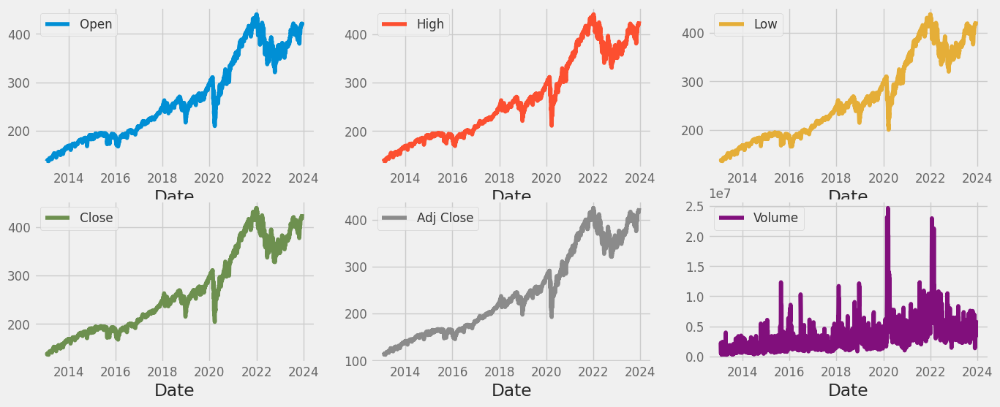

In [141]:
fig, axes = plt.subplots(nrows=2, ncols=3)
df[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']].plot(subplots=True, ax=axes)

In [142]:
import plotly.express as px

In [143]:
df['Mean Scaled Volume'] = 10*df['Volume']/np.mean(df['Volume'])

fig = px.line(df, y=['Open', 'High', 'Low', 'Adj Close', 'Mean Scaled Volume', 'Close'])
fig.show()

In [144]:
df = df.drop('Mean Scaled Volume', axis = 1)
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'Forward Returns', 'Target Returns', 'O-C', 'C-C',
       ...
       'TTM_TRND_6', 'VIDYA_14', 'VTXP_14', 'VTXM_14', 'VWAP_D', 'VWMA_10',
       'WCP', 'WILLR_14', 'WMA_10', 'ZL_EMA_10'],
      dtype='object', length=189)

In [145]:
fig = px.line(df, y=['Open', 'High', 'Low', 'Adj Close'])
fig.show()

In [146]:
fig = px.line(df, y=['Volume'])
fig.show()

In [147]:
fig = px.line(df, y=['Close', 'Forward Returns'])
fig.show()

###Seasonality

Here, we check for any seasonal patterns. We find that there is a discernable monthly, or rather quarterly, additive seasonality pattern in the daily returns time series.

In [148]:
import statsmodels.api as sm

def plotSeasonality(freq, colName):
  if freq == None:
    freq = 'd'
  if colName == None:
    colName = 'Forward Returns'
  analysis = df[colName].asfreq(freq).fillna(method='bfill').fillna(method='ffill')
  decompose_result = sm.tsa.seasonal_decompose(analysis, model='additive')
  fig = decompose_result.plot()

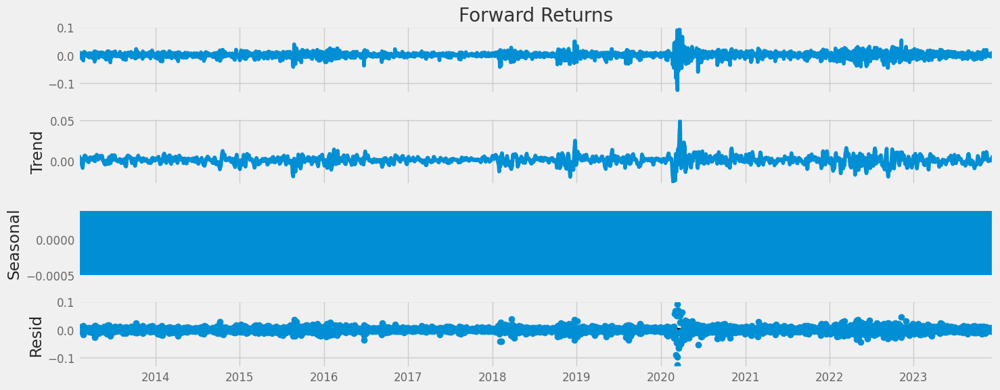

In [149]:
plotSeasonality('d', 'Forward Returns')

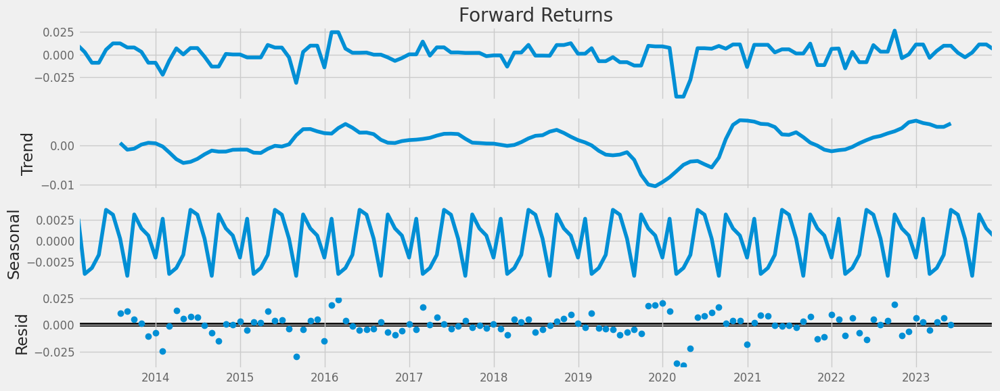

In [150]:
plotSeasonality('m', 'Forward Returns')

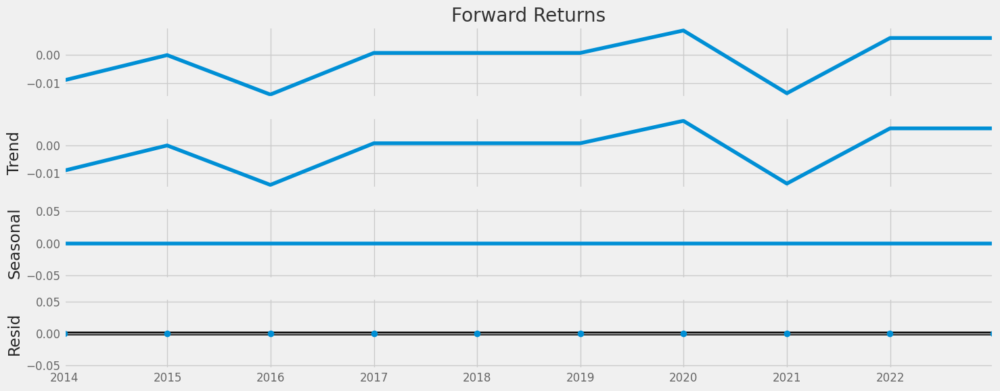

In [151]:
plotSeasonality('y', 'Forward Returns')

##4. Data Cleaning and Imputation

###Data Types

As noted above, all time series in the data are of a numerical type (int, float), and no categorical data that may need to be encoded is present, at this point in our analysis.

In [152]:
# data types

df.info()

for col in df.columns:
  print(type(df[col][1]))

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2736 entries, 2013-01-31 to 2023-12-12
Columns: 189 entries, Open to ZL_EMA_10
dtypes: float64(157), int64(20), uint8(12)
memory usage: 3.8 MB
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.int64'>
<class 'numpy.float64'>
<class 'numpy.int64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.uint8'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.fl

###Missing Data

We see that the data does not have any missing values which need to be handled, at this point in our analysis.

In [153]:
# missing data

pd.DataFrame( zip(list(df.columns), list(df.isnull().sum())))

,0,1
0,Open,0
1,High,0
2,Low,0
3,Close,0
4,Adj Close,0
...,...,...
184,VWMA_10,0
185,WCP,0
186,WILLR_14,0
187,WMA_10,0


###Outliers

We make the design choice to not remove outliers, since this is time series prediction with features derived from the univariate time series itself, and we want to retain as much unique information as available.

In [154]:
top_5 = df.sort_values(by='Close', ascending=False).head()
print('Highest returns: \n')
top_5

Highest returns: 



,Open,High,Low,Close,Adj Close,Volume,Forward Returns,Target Returns,O-C,C-C,...,TTM_TRND_6,VIDYA_14,VTXP_14,VTXM_14,VWAP_D,VWMA_10,WCP,WILLR_14,WMA_10,ZL_EMA_10
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-03,437.929993,439.269989,435.640015,439.250000,425.171265,6017300,-0.000410,0,-1.320007,1.579987,...,1,426.147459,1.078391,0.829713,438.053335,432.273824,438.352501,-4.613406,436.609093,438.855852
2022-01-04,440.579987,441.260010,437.220001,439.070007,424.996979,6262200,-0.019340,0,1.509979,-6.690002,...,1,426.646893,1.178587,0.744896,439.183339,435.431037,439.155006,-8.774041,437.567094,438.905698
2021-12-29,438.500000,439.950012,437.540009,439.010010,424.938995,4596700,-0.002829,0,-0.510010,-0.220001,...,1,425.359482,1.084239,0.809658,438.833344,429.529298,438.877510,-4.939271,433.210368,438.799951
2021-12-27,433.980011,438.820007,433.950012,438.809998,424.745361,4986300,-0.000752,0,-4.829987,3.709991,...,1,424.835636,1.119942,0.754248,437.193339,427.852857,437.597504,-0.044448,429.766546,433.521891
2021-12-28,439.279999,440.190002,437.660004,438.480011,424.425964,4865800,0.001208,1,0.799988,-0.119995,...,1,425.105067,1.115938,0.793843,438.776672,428.531102,438.702507,-7.157766,431.526366,436.748823


In [155]:
fig = px.bar(top_5, x=top_5.index, y='Close')
fig.show()

In [156]:
bottom_5 = df.sort_values(by='Close', ascending=True).head()
print('Lowest returns: \n')
bottom_5

Lowest returns: 



,Open,High,Low,Close,Adj Close,Volume,Forward Returns,Target Returns,O-C,C-C,...,TTM_TRND_6,VIDYA_14,VTXP_14,VTXM_14,VWAP_D,VWMA_10,WCP,WILLR_14,WMA_10,ZL_EMA_10
Date,,,,,,,,,,,,,,,,,,,,,
2013-02-25,139.820007,139.979996,136.460007,136.460007,111.807198,1063400,0.006719,1,3.360001,-0.240005,...,-1,100.031618,0.914218,0.776734,137.633336,138.531207,137.340004,-100.000000,138.557093,137.731346
2013-02-04,137.679993,137.880005,136.860001,136.919998,112.184120,541400,0.010173,1,0.759995,0.779999,...,-1,75.563617,1.084697,0.671619,137.220001,137.378764,137.145000,-36.401798,137.454181,137.571593
2013-01-31,137.300003,137.699997,137.000000,137.119995,112.347954,443950,0.009580,1,0.180008,0.759995,...,-1,66.979531,1.250440,0.723292,137.273331,136.755871,137.234997,-25.000088,137.224727,137.616823
2013-02-26,137.100006,137.539993,136.220001,137.380005,112.560997,1571400,0.012442,1,-0.279999,0.940002,...,-1,100.502545,0.893591,1.012093,137.046666,138.313406,137.130001,-71.980584,138.289821,137.456559
2013-02-21,138.199997,138.220001,137.320007,137.880005,112.970665,1410350,0.008666,1,0.319992,0.759995,...,-1,99.453109,0.887159,0.798962,137.806671,138.784815,137.825005,-70.857021,139.028001,138.867810


In [157]:
fig = px.bar(bottom_5, x=bottom_5.index, y='Close')

fig.show()

In [158]:
# df with these outliers in March 2020 dropped
# df_clean = df[ ~df[ (df.index.year == 2020) & (df.index.month == 3) ] ]

###Class Imbalance
We see that the 0s and 1s have nearly equal distribution in our target variable. This is due to the binarization threshold we chose earlier in step 1, Data Collection. Hence, our formulation does not need class imbalance to be addressed at this stage.

In [159]:
# take out the Target variable
y = df['Target Returns'].values
# Value counts for class 1 and -1
pd.Series(y).value_counts()

0    1369
1    1367
dtype: int64

##5. Feature Transformation

####Visualization

#####Pair Plots

In [160]:
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'Forward Returns', 'Target Returns', 'O-C', 'C-C',
       ...
       'TTM_TRND_6', 'VIDYA_14', 'VTXP_14', 'VTXM_14', 'VWAP_D', 'VWMA_10',
       'WCP', 'WILLR_14', 'WMA_10', 'ZL_EMA_10'],
      dtype='object', length=189)

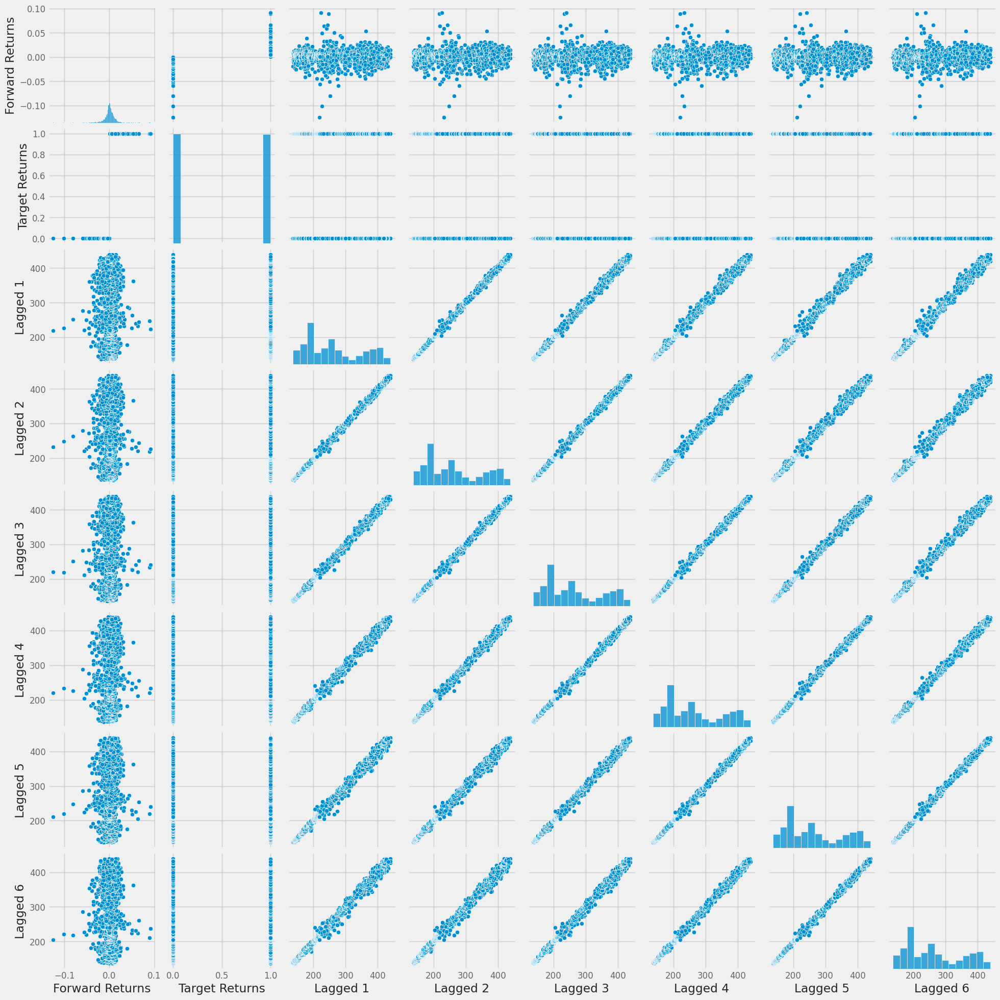

In [161]:
sns.pairplot(df[['Forward Returns', 'Target Returns', 'Lagged 1', 'Lagged 2', 'Lagged 3', 'Lagged 4', 'Lagged 5', 'Lagged 6']])

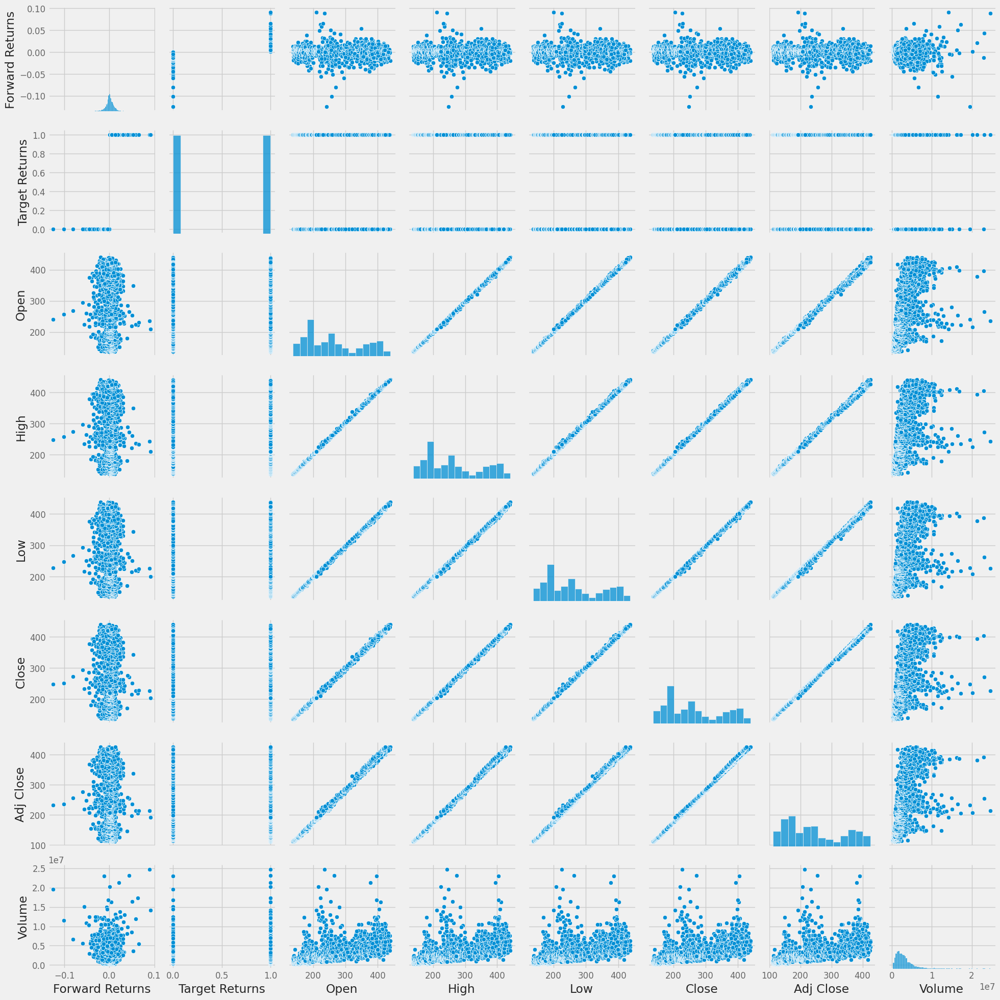

In [162]:
sns.pairplot(df[['Forward Returns', 'Target Returns', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']])

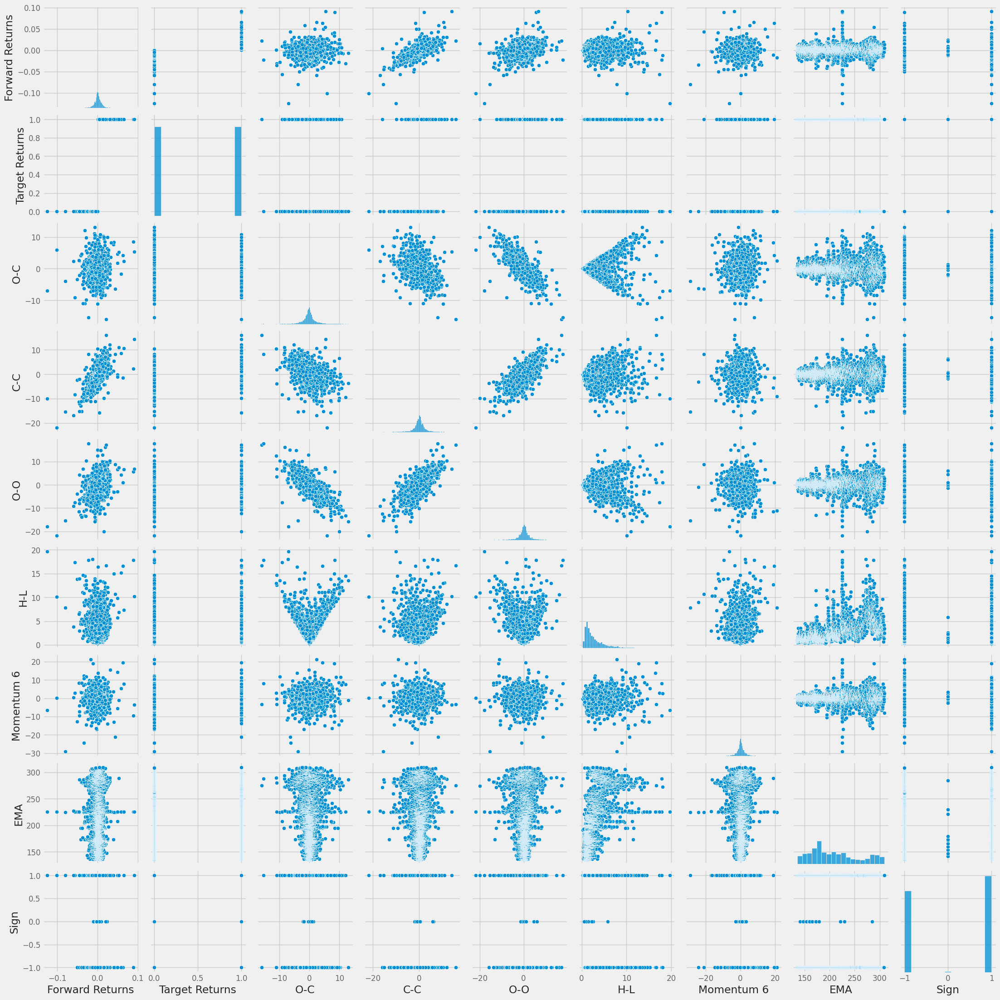

In [163]:
sns.pairplot(df[['Forward Returns', 'Target Returns', 'O-C', 'C-C', 'O-O', 'H-L','Momentum 6', 'EMA', 'Sign']])

In [164]:
#sns.pairplot(df, kind="hist")

#####Diving deep into relevant feature pairs

In [165]:
df['Scaled Close'] = df['Close']*0.1

In [166]:
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'Forward Returns', 'Target Returns', 'O-C', 'C-C',
       ...
       'VIDYA_14', 'VTXP_14', 'VTXM_14', 'VWAP_D', 'VWMA_10', 'WCP',
       'WILLR_14', 'WMA_10', 'ZL_EMA_10', 'Scaled Close'],
      dtype='object', length=190)

In [167]:
fig = px.line(df, y=['EMA', 'Close'])
fig.show()

In [168]:
fig = px.line(df, y=['Momentum 6', 'Scaled Close'])
fig.show()

In [169]:
fig = px.line(df, y=['Lagged 1', 'Lagged 2', 'Lagged 3', 'Lagged 4',
       'Lagged 5', 'Lagged 6', 'Close'])
fig.show()

In [170]:
fig = px.line(df, y=['O-C', 'H-L', 'Scaled Close'])
fig.show()

In [171]:
fig = px.line(df, y=['C-C','O-O', 'Scaled Close'])
fig.show()

In [172]:
df.drop(['Scaled Close'], axis=1, inplace=True)

####Feature Importance

#####Pearson Linear Correlation
Next, we check the linear correlation between all the features and the target variable.

We notice that a number of features are highly correlated, however, we choose not to drop any features at this stage.

In [173]:
# check linear corr between the features  >>> pick the less dependent ones + with y >>> pick the more dependent one

# calculate the correlation matrix
corr = df.corr()

# plot the heatmap
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
def magnify():
    return [dict(selector="th", props=[("font-size", "7pt")]), dict(selector="td", props=[('padding', "0em 0em")]), dict(selector="th:hover", props=[("font-size", "12pt")]), dict(selector="tr:hover td:hover", props=[('max-width', '200px'), ('font-size', '12pt')])  ]

corr.style.background_gradient(cmap, axis=1).set_properties(**{'max-width': '80px', 'font-size': '10pt'}).set_caption("Hover to magify").set_precision(2).set_table_styles(magnify())

#####Random Forest

From the analysis below, we can possibly eliminate the lowest ranked features. In the list below, we pick the ones with information score < 0.0004.

'AMATe_LR_8_21_2', 'INC_1', 'SQZPRO_ON_NORMAL', 'AMATe_SR_8_21_2', 'SQZPRO_ON_NARROW', 'AOBV_SR_2', 'DEC_1', 'SQZ_OFF', 'WMA_10', 'nov', 'oct', 'SQZ_ON', 'DEMA_10', 'SUPERTd_7_3.0', 'TTM_TRND_6', 'AOBV_LR_2', 'EMA_10', 'ABER_ZG_5_15', 'feb', 'ZL_EMA_10', 'BBM_5_2.0', 'Low', 'TRIMA_10', 'TEMA_10', 'LDECAY_5', 'SQZPRO_OFF', 'ITS_9', 'LR_14', 'SWMA_10', 'MIDPRICE_2', 'ABER_SG_5_15', 'TOS_STDEVALL_L_1', 'aug', 'MIDPOINT_2',


In [174]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
try:
  import shap
except:
  !pip install shap
  import shap
from matplotlib import pyplot as plt
plt.rcParams.update({'figure.figsize': (12.0, 8.0)})
plt.rcParams.update({'font.size': 14})

In [175]:
X = df.drop( ['Forward Returns','Target Returns'], axis=1).values
y = df['Target Returns'].values

In [176]:
rf = RandomForestRegressor(n_estimators=100)
rf.fit(X, y)

RandomForestRegressor()

In [177]:
features = df.drop( ['Forward Returns','Target Returns'], axis=1).columns

In [178]:
fi = pd.DataFrame( list(zip( features, rf.feature_importances_)), columns = ['Feature', 'RF Importance'] )

fi = fi.sort_values(['RF Importance'], ascending=True)

fi

,Feature,RF Importance
45,AMATe_SR_8_21_2,0.000065
152,SQZPRO_ON_NARROW,0.000075
44,AMATe_LR_8_21_2,0.000087
73,DEC_1,0.000123
102,INC_1,0.000157
...,...,...
8,O-O,0.015557
62,BOP,0.021456
6,O-C,0.043363
78,DPO_20,0.060693


<Axes: >

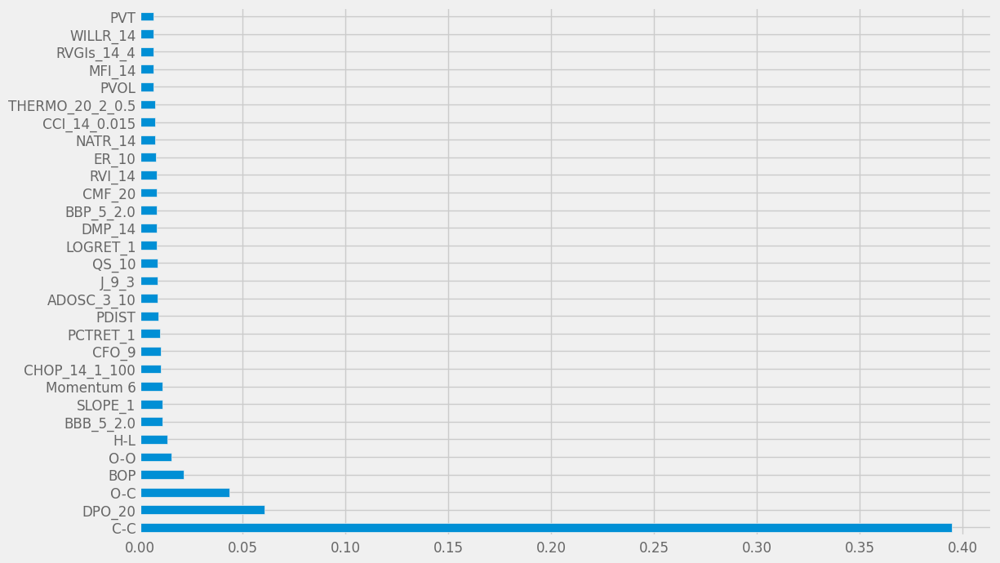

In [179]:
# plt.barh(features, rf.feature_importances_)
# plt.xlabel("Random Forest Feature Importance")

feat_importances = pd.Series(rf.feature_importances_, index=features)
feat_importances.nlargest(30).plot(kind='barh')

In [180]:
RF_colsToDrop = ['AMATe_LR_8_21_2', 'INC_1', 'SQZPRO_ON_NORMAL', 'AMATe_SR_8_21_2', 'SQZPRO_ON_NARROW', 'AOBV_SR_2', 'DEC_1', 'SQZ_OFF', 'WMA_10', 'nov', 'oct', 'SQZ_ON', 'DEMA_10', 'SUPERTd_7_3.0', 'TTM_TRND_6', 'AOBV_LR_2', 'EMA_10', 'ABER_ZG_5_15', 'feb', 'ZL_EMA_10', 'BBM_5_2.0', 'Low', 'TRIMA_10', 'TEMA_10', 'LDECAY_5', 'SQZPRO_OFF', 'ITS_9', 'LR_14', 'SWMA_10', 'MIDPRICE_2', 'ABER_SG_5_15', 'TOS_STDEVALL_L_1', 'aug', 'MIDPOINT_2',]

#####Boruta

Given the other analyses we have do in this report for feature importance gauging, the results given by Boruta run for 10 iterations are counter-intuitive. Hence, we will not be considering the results of Boruta when deciding which features to drop.

In [181]:
from sklearn.ensemble import RandomForestRegressor
try:
    from boruta import BorutaPy
except:
    !pip install Boruta
    from boruta import BorutaPy

In [193]:
X = df.drop( ['Forward Returns','Target Returns'], axis=1)
y = df['Target Returns']

In [197]:
model = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)

feature_selector = BorutaPy(
    verbose=2,
    estimator=model,
    n_estimators='auto',
    max_iter= 2 #10  # number of iterations to perform
)

# train Boruta
feature_selector.fit(np.array(X), np.array(y))

# save data
X_columns = df.drop( ['Forward Returns','Target Returns'], axis=1).columns
boruta_no = list()

# print support and ranking for each feature
print("\n------Support and Ranking for each feature------")
for i in range(len(feature_selector.support_)):
    if feature_selector.support_[i]:
        print("Passes the test: ", X_columns[i], " - Ranking: ", feature_selector.ranking_[i])
    else:
        boruta_no.append(X_columns[i])
        print("Doesn't pass the test: ", X_columns[i], " - Ranking: ", feature_selector.ranking_[i])

Iteration: 	1 / 2
Confirmed: 	0
Tentative: 	187
Rejected: 	0


BorutaPy finished running.

Iteration: 	2 / 2
Confirmed: 	0
Tentative: 	7
Rejected: 	0

------Support and Ranking for each feature------
Doesn't pass the test:  Open  - Ranking:  155
Doesn't pass the test:  High  - Ranking:  72
Doesn't pass the test:  Low  - Ranking:  70
Doesn't pass the test:  Close  - Ranking:  122
Doesn't pass the test:  Adj Close  - Ranking:  97
Doesn't pass the test:  Volume  - Ranking:  93
Doesn't pass the test:  O-C  - Ranking:  2
Doesn't pass the test:  C-C  - Ranking:  2
Doesn't pass the test:  O-O  - Ranking:  2
Doesn't pass the test:  H-L  - Ranking:  13
Doesn't pass the test:  Momentum 6  - Ranking:  43
Doesn't pass the test:  EMA  - Ranking:  89
Doesn't pass the test:  Sign  - Ranking:  77
Doesn't pass the test:  jan  - Ranking:  169
Doesn't pass the test:  feb  - Ranking:  179
Doesn't pass the test:  mar  - Ranking:  163
Doesn't pass the test:  apr  - Ranking:  174
Doesn't pass the test:  may 

In [198]:
print("Boruta rejects these columns: {}".format(boruta_no))

Boruta rejects these columns: ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'O-C', 'C-C', 'O-O', 'H-L', 'Momentum 6', 'EMA', 'Sign', 'jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec', 'Lagged 1', 'Lagged 2', 'Lagged 3', 'Lagged 4', 'Lagged 5', 'Lagged 6', 'OHLC4', 'ABER_ZG_5_15', 'ABER_SG_5_15', 'ABER_XG_5_15', 'ABER_ATR_5_15', 'ACCBL_20', 'ACCBM_20', 'ACCBU_20', 'AD', 'ADOSC_3_10', 'DMP_14', 'DMN_14', 'ALMA_10_6.0_0.85', 'AMATe_LR_8_21_2', 'AMATe_SR_8_21_2', 'OBV', 'OBV_min_2', 'OBV_max_2', 'OBVe_4', 'OBVe_12', 'AOBV_LR_2', 'AOBV_SR_2', 'AROOND_14', 'AROONU_14', 'AROONOSC_14', 'ATRr_14', 'BBL_5_2.0', 'BBM_5_2.0', 'BBU_5_2.0', 'BBB_5_2.0', 'BBP_5_2.0', 'BOP', 'CCI_14_0.015', 'CDL_DOJI_10_0.1', 'CDL_INSIDE', 'CFO_9', 'CG_10', 'CHOP_14_1_100', 'CMF_20', 'CMO_14', 'CTI_12', 'LDECAY_5', 'DEC_1', 'DEMA_10', 'DCL_20_20', 'DCM_20_20', 'DCU_20_20', 'DPO_20', 'EFI_13', 'EMA_10', 'ENTP_10', 'EOM_14_100000000', 'ER_10', 'BULLP_13', 'BEARP_13', 'FISHERT_9

#####PCA

Based on the results of PCA, we build 10 PCA vectors. These 10 vectors encompass the following features:

Feature Names: ['KCUe_20_2', 'ACCBU_20', 'DCU_20_20','CMO_14', 'RSI_14', 'SMI_5_20_5','CFO_9', 'PCTRET_1', 'LOGRET_1','NATR_14', 'BBB_5_2.0', 'CHOP_14_1_100','OBVe_12', 'OBV','OBV_max_2', 'OBV_min_2', 'OBVe_4','SMIo_5_20_5', 'RVGIs_14_4', 'AOBV_SR_2','SQZ_OFF', 'SQZPRO_ON_NORMAL', 'SQZ_ON','ER_10', 'PSARr_0.02_0.2', 'PSARaf_0.02_0.2','THERMOl_20_2_0.5', 'THERMOs_20_2_0.5', 'PVR']

Here, we choose to add the 10 PCA vectors to the dataset, while at the same time, we remove these 29 features, as a form of dimension reduction.

In [199]:
feature_vector = df.drop( ['Forward Returns','Target Returns'], axis=1)
target_vector = df['Target Returns']

feature_vector.shape

(2736, 187)

In [200]:
## Scaling feature vector

## To do : exclude one-hot encoded variables?
## To do : do PCA before applying encoded?

for col in feature_vector.columns:
  try:
    feature_vector[col] = (feature_vector[col] - feature_vector[col].mean()) / feature_vector[col].std()
  except:
    continue

feature_vector

,Open,High,Low,Close,Adj Close,Volume,O-C,C-C,O-O,H-L,...,TTM_TRND_6,VIDYA_14,VTXP_14,VTXM_14,VWAP_D,VWMA_10,WCP,WILLR_14,WMA_10,ZL_EMA_10
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-31,-1.484177,-1.485431,-1.480821,-1.486448,-1.432066,-1.124381,0.092500,0.234428,0.192616,-0.885861,...,-1.292774,-2.261683,1.555508,-0.836886,-1.484366,-1.486277,-1.484902,0.338665,-1.483777,-1.480257
2013-02-01,-1.476246,-1.474310,-1.471891,-1.471055,-1.420357,-0.345056,-0.179511,-0.360436,-0.136152,-0.805534,...,0.773248,-2.193176,1.218243,-1.424570,-1.472544,-1.481807,-1.472187,1.005475,-1.480511,-1.476348
2013-02-04,-1.479745,-1.483346,-1.482466,-1.488781,-1.433840,-1.082408,0.338999,0.241597,-0.022085,-0.757342,...,-1.292774,-2.162135,0.598960,-1.158259,-1.484988,-1.478989,-1.485952,-0.034065,-1.481097,-1.480784
2013-02-05,-1.479278,-1.473615,-1.473301,-1.472454,-1.421421,-1.136161,-0.239012,0.012250,0.011460,-0.733246,...,0.773248,-2.121499,0.681651,-1.657456,-1.473244,-1.476966,-1.473062,0.862750,-1.478931,-1.477331
2013-02-06,-1.477645,-1.475932,-1.471656,-1.471055,-1.420357,-1.136570,-0.230510,-0.224265,0.172488,-0.869793,...,0.773248,-2.082332,0.580473,-1.521213,-1.473011,-1.475620,-1.472537,0.909877,-1.476889,-1.473318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-06,1.831989,1.804087,1.814641,1.787489,1.856970,0.494159,1.609775,0.614289,-0.639365,0.523812,...,-1.292774,1.753253,0.368612,-0.642385,1.802192,1.816277,1.798534,-0.232345,1.808469,1.811499
2023-12-07,1.810994,1.804087,1.836026,1.825623,1.892227,0.083478,-0.545018,0.273847,0.152360,-0.207127,...,0.773248,1.757905,0.500177,-0.910848,1.821985,1.819346,1.822914,0.729239,1.813321,1.812684
2023-12-08,1.817526,1.823779,1.846249,1.846498,1.911527,0.890412,-1.067783,0.703877,0.648872,0.126206,...,0.773248,1.763879,0.454705,-0.981164,1.838940,1.824853,1.840849,0.999276,1.821339,1.825742


In [201]:
# number of principal components

## with 10 PC
num_pc = 10

from sklearn.decomposition import PCA

pca = PCA(n_components = num_pc)
pca.fit(feature_vector)
transformed_v = pca.transform(feature_vector)
transformed_v_df = pd.DataFrame(transformed_v, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5',
                                                        'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
#                                                         'PC11', 'PC12', 'PC13', 'PC14', 'PC15',
#                                                         'PC16', 'PC17', 'PC18', 'PC19',
                                                       ])
transformed_v_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-14.000565,-3.927137,-4.245805,1.776499,-0.354818,-1.761183,1.483982,0.007346,-0.077228,-1.208213
1,-13.927224,-5.783857,0.433437,2.562563,-1.456279,-1.657214,1.337977,1.472869,0.174579,1.309412
2,-13.881083,-2.252412,-4.198797,1.307678,0.267056,-0.115690,1.187739,-0.029825,2.731456,0.603820
3,-13.909186,-4.095762,0.663783,1.257865,-0.866201,-0.874139,2.060717,0.611518,2.575621,1.731718
4,-13.965496,-4.114936,0.487169,1.172167,-0.748027,-0.812962,0.883399,1.125633,1.606913,0.324596
...,...,...,...,...,...,...,...,...,...,...
2731,15.417498,-2.906592,-4.632977,-1.807217,2.717367,-3.671096,0.204106,1.012913,2.436726,-0.135057
2732,15.260633,-4.667156,0.264397,-2.369103,1.566868,-4.682902,0.873624,1.377550,2.430482,0.235314
2733,15.422995,-5.890218,1.530465,-1.786000,1.602435,-3.634253,0.673602,2.075856,3.731014,1.614356
2734,15.505789,-6.772590,1.572440,-1.438475,1.586825,-3.472976,-0.166909,2.137232,2.650857,0.990498


In [202]:
## Correlation for PCA components

transformed_v_df.corr().round(3)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
PC1,1.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0
PC2,0.0,1.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0
PC3,0.0,-0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PC4,0.0,-0.0,0.0,1.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0
PC5,-0.0,-0.0,0.0,-0.0,1.0,-0.0,0.0,0.0,0.0,-0.0
PC6,-0.0,-0.0,0.0,-0.0,-0.0,1.0,-0.0,-0.0,0.0,0.0
PC7,-0.0,0.0,0.0,-0.0,0.0,-0.0,1.0,-0.0,0.0,-0.0
PC8,0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,1.0,0.0,-0.0
PC9,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
PC10,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,1.0


In [203]:
## Variance explained with PCA

variance = pca.explained_variance_ratio_
print(variance)
print ("Original data had {} features,  principal components {}".format(len(feature_vector.columns), num_pc))
print("Cumulative Explained Variance: " + str(np.cumsum(variance)[-1]))

[0.44466599 0.18196262 0.04959211 0.03201665 0.02545026 0.02157616
 0.01770804 0.01421416 0.01021823 0.0096057 ]
Original data had 187 features,  principal components 10
Cumulative Explained Variance: 0.8070099235667093


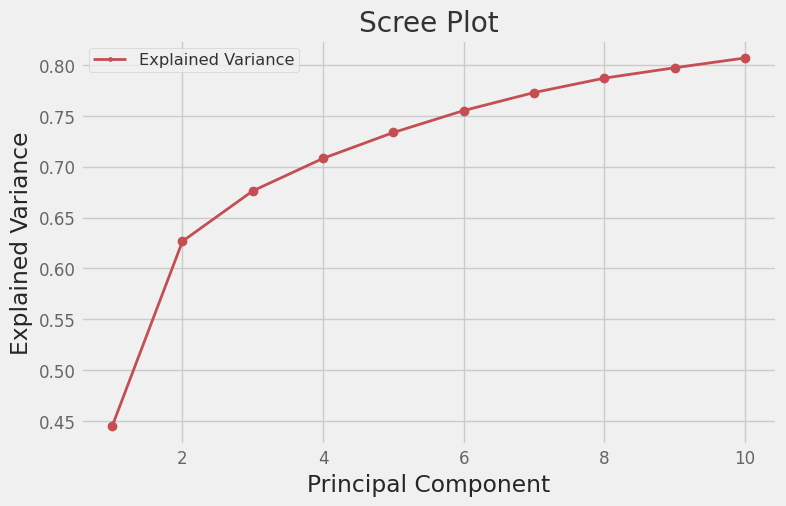

In [204]:
## Scree Plot

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,5))
sing_vals = np.arange(num_pc) + 1
plt.plot(np.arange(num_pc) + 1, np.cumsum(variance), 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')


leg = plt.legend(['Explained Variance'], loc='best', borderpad=0.3,
                 shadow=False, prop=matplotlib.font_manager.FontProperties(size='small'),
                 markerscale=0.4)

In [205]:
## Top attributes per PC

features = list(feature_vector)

for x in range(0,10):
    # Let's get the top components of PC1:
    print("top components of PC" + str(x+1) + ":")
    rel_values = np.abs(pca.components_[x])/np.sum(np.abs(pca.components_[x]))
    print("Feature Names: " + str([features[i] for i in np.argsort(-rel_values)[:3]]))
    print("Percentages: " + str(rel_values[np.argsort(-rel_values)[:3]]))
    print()

top components of PC1:
Feature Names: ['KCUe_20_2', 'ACCBU_20', 'DCU_20_20']
Percentages: [0.0108856  0.01088192 0.01088156]

top components of PC2:
Feature Names: ['CMO_14', 'RSI_14', 'SMI_5_20_5']
Percentages: [0.01748662 0.01748662 0.01733606]

top components of PC3:
Feature Names: ['CFO_9', 'PCTRET_1', 'LOGRET_1']
Percentages: [0.03228278 0.03210726 0.03196686]

top components of PC4:
Feature Names: ['NATR_14', 'BBB_5_2.0', 'CHOP_14_1_100']
Percentages: [0.02765389 0.02561834 0.02394045]

top components of PC5:
Feature Names: ['OBVe_12', 'OBVe_4', 'OBV']
Percentages: [0.03634604 0.03602406 0.03602073]

top components of PC6:
Feature Names: ['OBV_max_2', 'OBV_min_2', 'OBVe_4']
Percentages: [0.0293861  0.02934771 0.02905256]

top components of PC7:
Feature Names: ['SMIo_5_20_5', 'RVGIs_14_4', 'AOBV_SR_2']
Percentages: [0.02155777 0.02069364 0.0204137 ]

top components of PC8:
Feature Names: ['SQZ_OFF', 'SQZPRO_ON_NORMAL', 'SQZ_ON']
Percentages: [0.03346131 0.03346131 0.03346131]

top

In [206]:
## Bi-Plot

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

def biplot(score,coeff,y,labels=None):
    plt.rcParams['figure.figsize'] = [15, 10]
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, c = y)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
    plt.xlim(-0.6,0.8)
    plt.ylim(-0.6,0.8)
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

In [207]:
target_vector

Date
2013-01-31    1
2013-02-01    0
2013-02-04    1
2013-02-05    1
2013-02-06    0
             ..
2023-12-06    1
2023-12-07    1
2023-12-08    1
2023-12-11    1
2023-12-12    1
Name: Target Returns, Length: 2736, dtype: int64

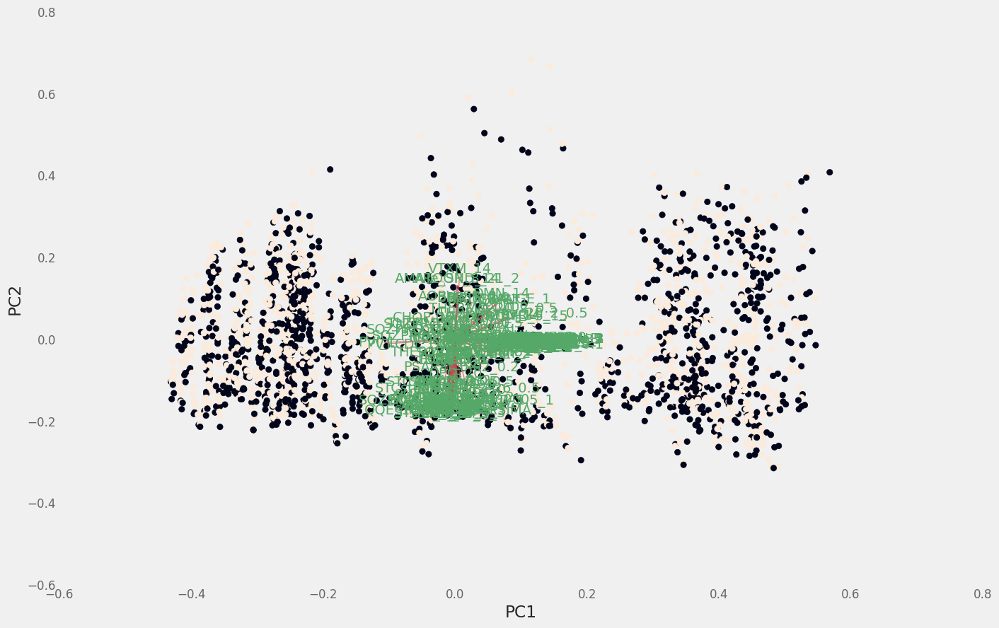

In [208]:
from sklearn.decomposition import PCA

pca_2d = PCA(n_components = 2)

x_new = pca_2d.fit_transform(feature_vector)


# Let's do a biplot of a PCA = 2 dimensions
biplot(x_new[:,0:2],np.transpose(pca.components_[0:2, :]),target_vector,labels=features)

In [209]:
# add the PCA vectors to a separate df which can be combined with the main df, if needed
## with 10 PC
num_pc = 10

pca = PCA(n_components = num_pc)
pca.fit(feature_vector)
transformed_v = pca.transform(feature_vector)
transformed_v_df = pd.DataFrame(transformed_v, columns=['PC1', 'PC2', 'PC3',
                                                         'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
#                                                         'PC11', 'PC12', 'PC13', 'PC14', 'PC15',
#                                                         'PC16', 'PC17', 'PC18', 'PC19',
                                                        ], index = df.index)

# remove the PCA vector contributing features from a copy of the main df
df_cols_dropped = df.drop( columns=['KCUe_20_2', 'ACCBU_20', 'DCU_20_20','CMO_14', 'RSI_14', 'SMI_5_20_5','CFO_9', 'PCTRET_1',
                                    'LOGRET_1', 'NATR_14', 'BBB_5_2.0', 'CHOP_14_1_100','OBVe_12', 'OBV','OBV_max_2', 'OBV_min_2', 'OBVe_4',
                            'SMIo_5_20_5', 'RVGIs_14_4', 'AOBV_SR_2','SQZ_OFF', 'SQZPRO_ON_NORMAL', 'SQZ_ON','ER_10',
                            'PSARr_0.02_0.2', 'PSARaf_0.02_0.2','THERMOl_20_2_0.5', 'THERMOs_20_2_0.5', 'PVR'],
                          axis=1)

In [210]:
# combined copy of the main df
df_PCA = df_cols_dropped.merge(transformed_v_df, left_index=True, right_index=True)

print(df.shape)
print(df_PCA.shape)
print(transformed_v_df.shape)
print(df_cols_dropped.shape)

df_PCA.isnull().sum()
df_PCA.dropna(inplace=True)
df_PCA.shape

(2736, 189)
(2736, 170)
(2736, 10)
(2736, 160)


(2736, 170)

#####Multi-Collinearity

Here, we test for multi-collinearity using Variance Inflation Factors. In general,
* VIF equal to 1 = variables are not correlated
* VIF between 1 and 5 = variables are moderately correlated
* VIF greater than 5 = variables are highly correlated

The test results show that most variables have very high VIFs. This is expected, since these features have all been derived from the same set of 6 initial features obtained from Yahoo Finance for the ETF. However, we make the choice to retain all features at this stage, with the intent of harnessing non-linear relationships highlighted by these features.

In [211]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler

In [212]:
X_check = df.drop( ['Forward Returns','Target Returns'], axis=1)
# X_check.columns

In [213]:
scaled_x = StandardScaler().fit_transform(X_check.values)
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(scaled_x, i) for i in range(scaled_x.shape[1])]
vif_info['Column'] = X_check.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
0,inf,Open
150,inf,SQZPRO_ON_WIDE
135,inf,RSI_14
59,inf,BBU_5_2.0
58,inf,BBM_5_2.0
...,...,...
167,1.603705,THERMOs_20_2_0.5
124,1.413554,PSARr_0.02_0.2
64,1.189407,CDL_DOJI_10_0.1
152,1.143137,SQZPRO_ON_NARROW


###Feature Selection

Based on the results of the analyses above, we finally decide to drop the low importance features highlighted by Random Forest feature importance, add the 10 PCA vectors, and remove the constituent features of these 10 PCA vectors. Note that we had already dropped features with excessive null values (>20) in step 2 of the model building process.

Thus, from an initial feature set of 253, we are now left with 140 features.

In [214]:
print(df.shape)

for colName in RF_colsToDrop:
  try:
    df_PCA.drop(colName, inplace=True, axis=1)
  except:
    continue

print(df_PCA.shape)

(2736, 189)
(2736, 140)


In [215]:
df_final = df_PCA.copy()

###Feature Scaling

Some of the classifiers that will be used are sensitive to scale of data. We include the minmax scaler for these classifiers in the Pipeline function in the Modeling step.

###Feature and Target Datasets

In [216]:
# take out the Predictor variable
X = df_final.drop( ['Forward Returns','Target Returns'], axis=1).values

X.shape # Predictors should be of 2D

(2736, 138)

In [217]:
# take out the Target variable
y = df_final['Target Returns'].values

y.shape  # Target Label should be 1D

(2736,)

In [218]:
# Value counts for class 1 and -1
pd.Series(y).value_counts()

0    1369
1    1367
dtype: int64

##6. Model Building & Optimization

###Baseline Model

Here, we first fit a "hyper-parameter non-tuned" model, going with Naive Bayes as our baseline model of choice.

####Split Data

In [219]:
# Splitting the datasets into training and testing data.
# Keep shuffle = False for financial time series
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Output the train and test data size
print(f"Train and Test dataset sizes: {len(X_train)}, {len(X_test)}")

Train and Test dataset sizes: 2188, 548


####Fit model

In [220]:
# Fit the model pipeline
pipe = Pipeline([
    ("classifier", GaussianNB())
      ])
pipe.fit(X_train, y_train)

Pipeline(steps=[('classifier', GaussianNB())])

In [221]:
# Target classes
class_names = pipe.classes_
class_names

array([0, 1])

####Predict

In [222]:
# Predicting labels on the test dataset
y_pred = pipe.predict(X_test)

In [223]:
# Test labels vs. predicted labels
pd.DataFrame( list(zip(y_test[:10],y_pred[:10])), columns = ['Test Labels', 'Predicted Labels'] )

,Test Labels,Predicted Labels
0,0,1
1,0,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,0,1


####Performance Metrics

In [224]:
# Accuracy
acc_train = accuracy_score(y_train, pipe.predict(X_train))
acc_test = accuracy_score(y_test, y_pred)
print(f'Train Accuracy: {acc_train:0.4}, Test Accuracy: {acc_test:0.4}')

Train Accuracy: 0.5146, Test Accuracy: 0.4745


True negative = 0, False positive = 288, False negative = 0, True positive = 260


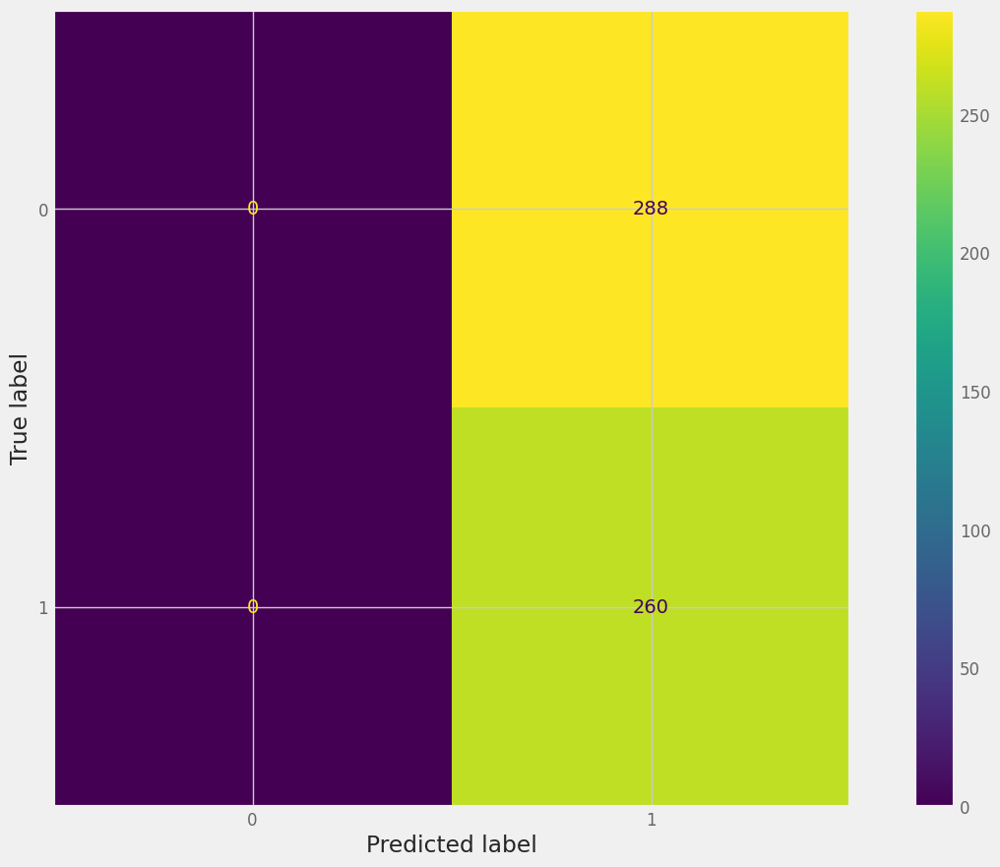

In [225]:
# Confusion matrix for binary classification
cm = confusion_matrix(y_test, y_pred, labels=class_names)
tn, fp, fn, tp = cm.ravel()
print('True negative = {}, False positive = {}, False negative = {}, True positive = {}'.format(tn, fp, fn, tp))

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot()
plt.show()

In [226]:
# Classification Report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       288
           1       0.47      1.00      0.64       260

    accuracy                           0.47       548
   macro avg       0.24      0.50      0.32       548
weighted avg       0.23      0.47      0.31       548



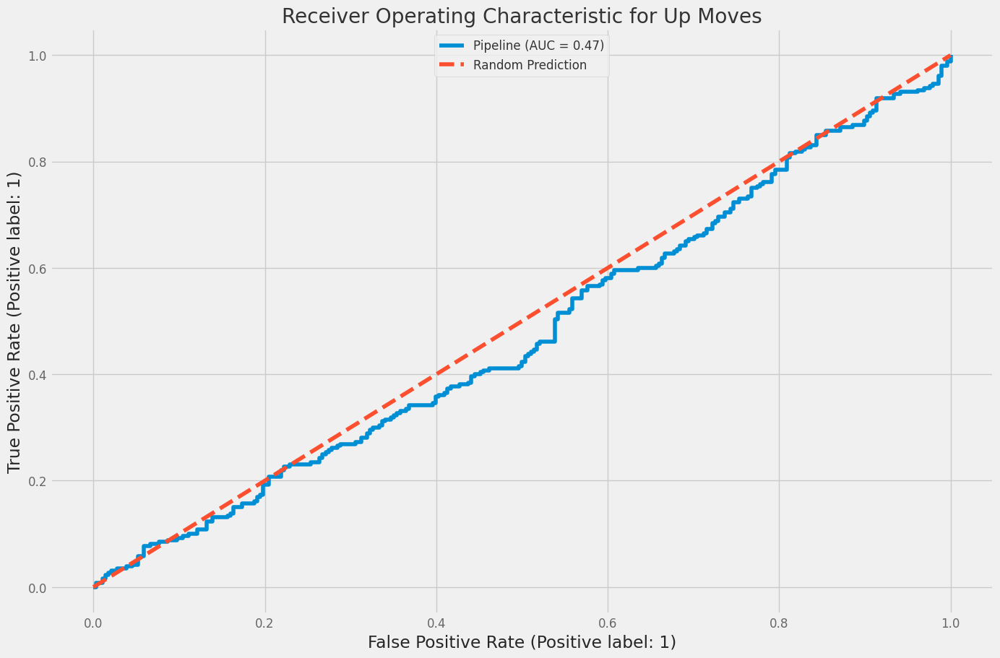

In [227]:
# Random Prediction
r_prob = [0 for _ in range(len(y_test))]
r_fpr, r_tpr, _ = roc_curve(y_test, r_prob, pos_label=1)

# Plot ROC Curve
RocCurveDisplay.from_estimator(pipe, X_test, y_test)
plt.plot(r_fpr, r_tpr, linestyle='dashed', label='Random Prediction')
plt.title('Receiver Operating Characteristic for Up Moves')
plt.legend(loc=9)
plt.show()

###Ensemble Model

####Data

In [228]:
X = df_final.drop( ['Forward Returns','Target Returns'], axis=1).values
y = df_final['Target Returns'].values

####Ensemble types

We have the following ensemble types:
* Bagging
* Boosting - GradientBoosting
* Voting - soft voter
* Stacking
* Blending


In [229]:
class Ensemble:
  def __init__(self, X, y, basemodels, testsize):
    self.X = X
    self.y = y
    self.models = basemodels
    self.testsize = testsize

  # evalaute predictions
  def get_accuracy(self, y_pred):
    score = accuracy_score(self.y_test, y_pred)
    print(f'Classifier Accuracy: {score*100:.4}')

  # confusion matrix
  def plot_confusion_matrix(self, y_pred):
    ConfusionMatrixDisplay.from_predictions(self.y_test, y_pred, cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

  # roc
  def plot_roc(self, y_prob):
    RocCurveDisplay.from_predictions(self.y_test, y_prob)
    plt.plot([0,1],[0,1], linestyle="--", label='Random 50:50')
    plt.legend()
    plt.title("AUC-ROC Curve \n")
    plt.show()

  # classification report
  def get_classification_report(self, y_pred):
    print("Classification Report:")
    print(classification_report(self.y_test, y_pred))

In [230]:
class BaggingEnsemble(Ensemble):
  def __init__(self, X, y, basemodels=None, testsize=0.20):
    super().__init__(X, y, basemodels, testsize)
    # apply split
    self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=self.testsize, shuffle=False)

  # fit bagging ensemble
  def fit_ensemble(self):
    # define RFC
    forest = RandomForestClassifier(n_jobs=-1, class_weight='balanced',random_state=1, max_depth=5)
    forest.fit(self.X_train, self.y_train)
    y_pred = forest.predict(self.X_test)
    y_prob = forest.predict_proba(self.X_test)[:,1]
    return y_pred, y_prob

In [231]:
class BoostingEnsemble(Ensemble):
  def __init__(self, X, y, basemodels=None, testsize=0.20):
    super().__init__(X, y, basemodels, testsize)
    # apply split
    self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=self.testsize, shuffle=False)

  # fit boosting ensemble
  def fit_ensemble(self):
    # define GBC
    boosting = GradientBoostingClassifier(random_state=1, max_depth=5)
    boosting.fit(self.X_train, self.y_train)
    y_pred = boosting.predict(self.X_test)
    y_prob = boosting.predict_proba(self.X_test)[:,1]
    return y_pred, y_prob

In [232]:
class VotingEnsemble(Ensemble):
  def __init__(self, X, y, basemodels, testsize=0.20):
    super().__init__(X, y, basemodels, testsize)
    # apply split
    self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=self.testsize, shuffle=False)

  # fit voting ensemble
  def fit_ensemble(self):
    accuracy_scores = list()
    for name, model in self.models:
      # fit using training set
      model.fit(self.X_train, self.y_train)
      accuracy_scores.append(accuracy_score(self.y_test, model.predict(self.X_test)))
    voting = VotingClassifier(estimators=self.models, voting='soft')
    voting = voting.fit(self.X_train, self.y_train)
    y_pred = voting.predict(self.X_test)
    y_prob = voting.predict_proba(self.X_test)[:,1]
    return accuracy_scores, y_pred, y_prob

In [233]:
class StackingEnsemble(Ensemble):
  def __init__(self, X, y, basemodels, metamodel, testsize=0.20):
    super().__init__(X, y, basemodels, testsize)
    self.metamodel = metamodel
    # apply split
    self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=self.testsize, shuffle=False)

  def fit_ensemble(self):
    accuracy_scores = list()
    for name, model in self.models:
      model.fit(self.X_train, self.y_train)
      accuracy_scores.append(accuracy_score(self.y_test, model.predict(self.X_test)))

    stacking = StackingClassifier(estimators=self.models,
    final_estimator=self.metamodel, cv='prefit')
    stacking = stacking.fit(self.X_train, self.y_train)

    y_pred = stacking.predict(self.X_test)
    y_prob = stacking.predict_proba(self.X_test)[:,1]

    return accuracy_scores, y_pred, y_prob

In [234]:
class BlendingEnsemble(Ensemble):
  def __init__(self, X, y, basemodels, metamodel, testsize=0.10, valsize=0.20):
    super().__init__(X, y, basemodels, testsize)
    self.metamodel = metamodel
    self.valsize = valsize
    # original split
    self.X_train_full, self.X_test, self.y_train_full, self.y_test = train_test_split(self.X, self.y, test_size=self.testsize, shuffle=False)
    # split training set into train and validation sets
    self.X_train, self.X_val, self.y_train, self.y_val = train_test_split(self.X_train_full, self.y_train_full,
    test_size=self.valsize, shuffle=False)

  # fit ensemble
  def fit_ensemble(self):
    # fit all models on the training set and predict on hold out (val) set
    meta_X = list()

    for name, model in self.models:
      # step 1: train the base model on the subset
      model.fit(self.X_train, self.y_train)
      # step 2: predict using base models using validation data (subset)
      yhat = model.predict_proba(self.X_val)[:,1]
      # store predictions as input for blending
      meta_X.append(yhat)

    # new data set - create a 2D array from predictions, each set is an input feature
    meta_X = np.column_stack(meta_X)
    # define blending model
    meta_model = self.metamodel
    # step 3: train meta model on the new dataset
    meta_model.fit(meta_X, self.y_val)
    # make a predictions with the blending ensemble
    # make predictions with base models
    meta_X = list()

    for name, model in self.models:
      # step 4(a): predict using meta model on the test data (original split)
      yhat = model.predict_proba(self.X_test)[:,1]
      # store predictions as input for blending
      meta_X.append(yhat)

    # new test dataset - create a 2D array from predictions, each set is an input feature
    meta_X = np.column_stack(meta_X)

    # step 4(b): final prediction on new test dataset
    y_pred = meta_model.predict(meta_X)
    y_prob = meta_model.predict_proba(meta_X)[:,1]
    return y_pred, y_prob

####Hyper-Parameter tuning for the base learners

#####A. Random Forest

In [235]:
# define objective function
def optimize(trail, x, y):

  # specify params range
  n_estimators = trail.suggest_int("n_estimators", 100, 1500)
  max_depth = trail.suggest_int("max_depth", 3, 15)
  max_features = trail.suggest_float("max_features", 0.01, 1.0)
  criterion = trail.suggest_categorical("criterion", ['gini', 'entropy', 'log_loss'])

  model = RandomForestClassifier(
                n_estimators = n_estimators,
                max_depth= max_depth,
                max_features = max_features,
                criterion = criterion
                )

  tscv = TimeSeriesSplit(n_splits=2, gap=1)
  fscore = []
  for idx in tscv.split(x):
    train_idx, test_idx = idx[0], idx[1]
    xtrain = x[train_idx]
    ytrain = y[train_idx]

    xtest = x[test_idx]
    ytest = y[test_idx]

    model.fit(xtrain, ytrain)
    preds = model.predict(xtest)

    cv_f1 = f1_score(ytest, preds, average='weighted')
    fscore.append(cv_f1)

  return np.mean(fscore)

# run Optuna
if __name__ == "__main__":
  optimization_function = partial(optimize, x=X, y=y)

  studyA = optuna.create_study(study_name='rfhp', direction="maximize")
  studyA.optimize(optimization_function, n_trials=5)

[I 2024-01-20 05:05:21,431] A new study created in memory with name: rfhp
[I 2024-01-20 05:07:24,001] Trial 0 finished with value: 0.7940794826231021 and parameters: {'n_estimators': 790, 'max_depth': 5, 'max_features': 0.8156764654061177, 'criterion': 'entropy'}. Best is trial 0 with value: 0.7940794826231021.
[I 2024-01-20 05:08:27,133] Trial 1 finished with value: 0.7925470664301308 and parameters: {'n_estimators': 420, 'max_depth': 9, 'max_features': 0.5846883709047657, 'criterion': 'log_loss'}. Best is trial 0 with value: 0.7940794826231021.
[I 2024-01-20 05:09:21,737] Trial 2 finished with value: 0.7801425748741162 and parameters: {'n_estimators': 653, 'max_depth': 3, 'max_features': 0.9627642826517308, 'criterion': 'gini'}. Best is trial 0 with value: 0.7940794826231021.
[I 2024-01-20 05:09:35,697] Trial 3 finished with value: 0.7135568750355381 and parameters: {'n_estimators': 752, 'max_depth': 6, 'max_features': 0.06565610734396987, 'criterion': 'log_loss'}. Best is trial 0 wi

In [236]:
# plot history
optuna.visualization.plot_optimization_history(studyA)

In [237]:
# plot accuracies for each hp trail
optuna.visualization.plot_slice(studyA)

In [238]:
# plot the surface
optuna.visualization.plot_contour(studyA, params=['n_estimators', 'max_depth', 'max_features'])

In [239]:
# plot parallel coordinates
optuna.visualization.plot_parallel_coordinate(studyA)

#####B. Gaussian Naive Bayes

In [240]:
# No parameters to optimize

#####C. Decision Tree

In [241]:
# define objective function
def optimize(trail, x, y):

  # specify params range
  max_depth = trail.suggest_int("max_depth", 3, 20)
  max_features = trail.suggest_float("max_features", 0.01, 1.0)
  criterion = trail.suggest_categorical("criterion", ['gini', 'entropy', 'log_loss'])

  model = DecisionTreeClassifier(
                criterion=criterion,
                max_depth= max_depth,
                max_features = max_features
                )

  tscv = TimeSeriesSplit(n_splits=2, gap=1)
  fscore = []
  for idx in tscv.split(x):
    train_idx, test_idx = idx[0], idx[1]
    xtrain = x[train_idx]
    ytrain = y[train_idx]

    xtest = x[test_idx]
    ytest = y[test_idx]

    model.fit(xtrain, ytrain)
    preds = model.predict(xtest)

    cv_f1 = f1_score(ytest, preds, average='weighted')
    fscore.append(cv_f1)

  return np.mean(fscore)

# run Optuna
if __name__ == "__main__":
  optimization_function = partial(optimize, x=X, y=y)

  studyC = optuna.create_study(study_name='carthp', direction="maximize")
  studyC.optimize(optimization_function, n_trials=15)

[I 2024-01-20 05:11:17,693] A new study created in memory with name: carthp
[I 2024-01-20 05:11:17,839] Trial 0 finished with value: 0.6643626361041999 and parameters: {'max_depth': 10, 'max_features': 0.3206165583364795, 'criterion': 'entropy'}. Best is trial 0 with value: 0.6643626361041999.
[I 2024-01-20 05:11:17,868] Trial 1 finished with value: 0.4884493451559243 and parameters: {'max_depth': 16, 'max_features': 0.026226602799290566, 'criterion': 'log_loss'}. Best is trial 0 with value: 0.6643626361041999.
[I 2024-01-20 05:11:17,926] Trial 2 finished with value: 0.6171496326962626 and parameters: {'max_depth': 4, 'max_features': 0.20831592729347806, 'criterion': 'entropy'}. Best is trial 0 with value: 0.6643626361041999.
[I 2024-01-20 05:11:18,133] Trial 3 finished with value: 0.6745529760699549 and parameters: {'max_depth': 15, 'max_features': 0.4925851467081106, 'criterion': 'entropy'}. Best is trial 3 with value: 0.6745529760699549.
[I 2024-01-20 05:11:18,209] Trial 4 finished 

In [242]:
# plot history
optuna.visualization.plot_optimization_history(studyC)

In [243]:
# plot accuracies for each hp trail
optuna.visualization.plot_slice(studyC)

In [244]:
# plot the surface
optuna.visualization.plot_contour(studyC, params=['max_depth', 'max_features', 'criterion'])

In [245]:
# plot parallel coordinates
optuna.visualization.plot_parallel_coordinate(studyC)

#####D. K Nearest Neighbours

In [246]:
# define objective function
def optimize(trail, x, y):

  # specify params range
  algorithm = trail.suggest_categorical("algorithm", ['auto', 'ball_tree', 'kd_tree', 'brute'])
  metric = trail.suggest_categorical("metric", ['manhattan', 'l2', 'euclidean', 'minkowski'])
  n_neighbors = trail.suggest_int("n_neighbors", 5, 10)

  model = KNeighborsClassifier(
                algorithm = algorithm,
                metric = metric,
                n_neighbors = n_neighbors
                )

  tscv = TimeSeriesSplit(n_splits=2, gap=1)
  fscore = []
  for idx in tscv.split(x):
    train_idx, test_idx = idx[0], idx[1]
    xtrain = x[train_idx]
    ytrain = y[train_idx]

    xtest = x[test_idx]
    ytest = y[test_idx]

    model.fit(xtrain, ytrain)
    preds = model.predict(xtest)

    cv_f1 = f1_score(ytest, preds, average='weighted')
    fscore.append(cv_f1)

  return np.mean(fscore)

# run Optuna
if __name__ == "__main__":
  optimization_function = partial(optimize, x=X, y=y)

  studyD = optuna.create_study(study_name='knnhp', direction="maximize")
  studyD.optimize(optimization_function, n_trials=15)

[I 2024-01-20 05:11:20,144] A new study created in memory with name: knnhp
[I 2024-01-20 05:11:20,517] Trial 0 finished with value: 0.49715470387682587 and parameters: {'algorithm': 'kd_tree', 'metric': 'minkowski', 'n_neighbors': 9}. Best is trial 0 with value: 0.49715470387682587.
[I 2024-01-20 05:11:20,790] Trial 1 finished with value: 0.500390130023306 and parameters: {'algorithm': 'ball_tree', 'metric': 'euclidean', 'n_neighbors': 10}. Best is trial 1 with value: 0.500390130023306.
[I 2024-01-20 05:11:21,773] Trial 2 finished with value: 0.4958580181882225 and parameters: {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 9}. Best is trial 1 with value: 0.500390130023306.
[I 2024-01-20 05:11:22,076] Trial 3 finished with value: 0.500390130023306 and parameters: {'algorithm': 'auto', 'metric': 'minkowski', 'n_neighbors': 10}. Best is trial 1 with value: 0.500390130023306.
[I 2024-01-20 05:11:22,819] Trial 4 finished with value: 0.4958580181882225 and parameters: {'algorith

In [247]:
# plot history
optuna.visualization.plot_optimization_history(studyD)

In [248]:
# plot accuracies for each hp trail
optuna.visualization.plot_slice(studyD)

In [249]:
# plot the surface
optuna.visualization.plot_contour(studyD, params=['algorithm', 'metric', 'n_neighbors'])

In [250]:
# plot parallel coordinates
optuna.visualization.plot_parallel_coordinate(studyD)

#####E. SVC

In [259]:
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
# define objective function
def optimize(trail, x, y):

  # specify params range
  kernel = trail.suggest_categorical("kernel", ['linear', 'poly', 'rbf', 'sigmoid'])
  tol = trail.suggest_float("tol", 0.0001, 0.001)
  # C = trail.suggest_float("C", 0.1, 0.9)

  model = SVC(
                kernel = kernel,
                tol = tol
                # C = C
                )

  tscv = TimeSeriesSplit(n_splits=2, gap=1)
  fscore = []
  for idx in tscv.split(x):
    train_idx, test_idx = idx[0], idx[1]
    xtrain = x[train_idx]
    ytrain = y[train_idx]

    xtest = x[test_idx]
    ytest = y[test_idx]

    model.fit(xtrain, ytrain)
    preds = model.predict(xtest)

    cv_f1 = f1_score(ytest, preds, average='weighted')
    fscore.append(cv_f1)

  return np.mean(fscore)

# run Optuna
if __name__ == "__main__":
  optimization_function = partial(optimize, x=X_scaled, y=y)

  studyE = optuna.create_study(study_name='svchp', direction="maximize")
  studyE.optimize(optimization_function, n_trials=5)

In [ ]:
# plot history
optuna.visualization.plot_optimization_history(studyE)

In [ ]:
# plot accuracies for each hp trail
optuna.visualization.plot_slice(studyE)

In [ ]:
# plot the surface
optuna.visualization.plot_contour(studyE, params=['kernel', 'tol'])   #, 'C'])

In [ ]:
# plot parallel coordinates
optuna.visualization.plot_parallel_coordinate(studyE)

#####F. MLP

In [260]:
# define objective function
def optimize(trail, x, y):

  # specify params range
  activation = trail.suggest_categorical("activation", ['identity', 'logistic', 'tanh', 'relu'])
  solver = trail.suggest_categorical("solver", ['lbfgs', 'sgd', 'adam'])
  alpha = trail.suggest_float("alpha", 0.00001, 0.01)
  learning_rate_init = trail.suggest_float('learning_rate_init', 0.0001, 0.1, step=0.005)
  # first_layer_neurons = trail.suggest_int('first_layer_neurons', 10, 100, step=10)
  # second_layer_neurons = trail.suggest_int('second_layer_neurons', 10, 100, step=10)

  model = MLPClassifier(
                activation = activation,
                solver = solver,
                alpha = alpha,
                learning_rate_init = learning_rate_init
                # first_layer_neurons = first_layer_neurons,
                # second_layer_neurons = second_layer_neurons,
                )

  tscv = TimeSeriesSplit(n_splits=2, gap=1)
  fscore = []
  for idx in tscv.split(x):
    train_idx, test_idx = idx[0], idx[1]
    xtrain = x[train_idx]
    ytrain = y[train_idx]

    xtest = x[test_idx]
    ytest = y[test_idx]

    model.fit(xtrain, ytrain)
    preds = model.predict(xtest)

    cv_f1 = f1_score(ytest, preds, average='weighted')
    fscore.append(cv_f1)

  return np.mean(fscore)

# run Optuna
if __name__ == "__main__":
  optimization_function = partial(optimize, x=X_scaled, y=y)

  studyF = optuna.create_study(study_name='mlphp', direction="maximize")
  studyF.optimize(optimization_function, n_trials=15)

[I 2024-01-20 05:21:59,241] A new study created in memory with name: mlphp
[I 2024-01-20 05:22:12,639] Trial 0 finished with value: 0.7052920901494725 and parameters: {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0013720401436078285, 'learning_rate_init': 0.08510000000000001}. Best is trial 0 with value: 0.7052920901494725.
[I 2024-01-20 05:22:21,848] Trial 1 finished with value: 0.820095165079364 and parameters: {'activation': 'identity', 'solver': 'lbfgs', 'alpha': 0.004051536845948525, 'learning_rate_init': 0.0651}. Best is trial 1 with value: 0.820095165079364.
[I 2024-01-20 05:22:24,084] Trial 2 finished with value: 0.38285597643711455 and parameters: {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.000731611781968238, 'learning_rate_init': 0.0451}. Best is trial 1 with value: 0.820095165079364.
[I 2024-01-20 05:22:31,152] Trial 3 finished with value: 0.4615364236184931 and parameters: {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.007015850069197432, 'learning_

In [261]:
# plot history
optuna.visualization.plot_optimization_history(studyF)

In [262]:
# plot accuracies for each hp trail
optuna.visualization.plot_slice(studyF)

In [263]:
# plot the surface
optuna.visualization.plot_contour(studyF, params=['activation', 'solver', 'alpha', 'learning_rate_init' ])
                                                # , 'first_layer_neurons', 'second_layer_neurons'])

In [264]:
# plot parallel coordinates
optuna.visualization.plot_parallel_coordinate(studyF)

#####G. Logistic Regression

In [277]:
# define objective function
def optimize(trail, x, y):

  # specify params range
  penalty = trail.suggest_categorical("penalty", ['none','l2'])
  solver = trail.suggest_categorical("solver", ['lbfgs', 'newton-cg', 'newton-cholesky'])
  tol = trail.suggest_float("tol", 0.00001, 0.001)
  # C = trail.suggest_float("C", 0.1, 1)

  model = LogisticRegression(
                penalty = penalty,
                solver = solver,
                tol = tol,
                # C = C
                )

  tscv = TimeSeriesSplit(n_splits=2, gap=1)
  fscore = []
  for idx in tscv.split(x):
    train_idx, test_idx = idx[0], idx[1]
    xtrain = x[train_idx]
    ytrain = y[train_idx]

    xtest = x[test_idx]
    ytest = y[test_idx]

    model.fit(xtrain, ytrain)
    preds = model.predict(xtest)

    cv_f1 = f1_score(ytest, preds, average='weighted')
    fscore.append(cv_f1)

  return np.mean(fscore)

# run Optuna
if __name__ == "__main__":
  optimization_function = partial(optimize, x=X, y=y)

  studyG = optuna.create_study(study_name='lrhp', direction="maximize")
  studyG.optimize(optimization_function, n_trials=15)

[I 2024-01-20 05:31:39,843] A new study created in memory with name: lrhp
[I 2024-01-20 05:31:40,135] Trial 0 finished with value: 0.4269718128709279 and parameters: {'penalty': 'l2', 'solver': 'newton-cholesky', 'tol': 0.00038640181420621745}. Best is trial 0 with value: 0.4269718128709279.
[I 2024-01-20 05:31:40,403] Trial 1 finished with value: 0.4269718128709279 and parameters: {'penalty': 'none', 'solver': 'newton-cholesky', 'tol': 0.0004886465247679416}. Best is trial 0 with value: 0.4269718128709279.
[I 2024-01-20 05:31:40,637] Trial 2 finished with value: 0.4269718128709279 and parameters: {'penalty': 'none', 'solver': 'newton-cholesky', 'tol': 0.0009705731912756046}. Best is trial 0 with value: 0.4269718128709279.
[I 2024-01-20 05:31:40,903] Trial 3 finished with value: 0.4269718128709279 and parameters: {'penalty': 'l2', 'solver': 'newton-cholesky', 'tol': 0.0006360312090318997}. Best is trial 0 with value: 0.4269718128709279.
[I 2024-01-20 05:31:41,168] Trial 4 finished with

In [278]:
# plot history
optuna.visualization.plot_optimization_history(studyG)

In [279]:
# plot accuracies for each hp trail
optuna.visualization.plot_slice(studyG)

In [282]:
# plot the surface
optuna.visualization.plot_contour(studyG, params=['penalty', 'solver', 'tol'])

In [281]:
# plot parallel coordinates
optuna.visualization.plot_parallel_coordinate(studyG)

#####H. Gaussian Process Classifier

In [ ]:
# define objective function
def optimize(trail, x, y):

  # specify params range
  random_state = trail.suggest_int('random_state', 1, 42)
  kernel = trail.suggest_categorical('kernel', [1*RBF(), 1*DotProduct(), 1*Matern(),  1*RationalQuadratic(), 1*WhiteKernel()])

  model = GaussianProcessClassifier(
                random_state = random_state,
                kernel = kernel
                )

  tscv = TimeSeriesSplit(n_splits=2, gap=1)
  fscore = []
  for idx in tscv.split(x):
    train_idx, test_idx = idx[0], idx[1]
    xtrain = x[train_idx]
    ytrain = y[train_idx]

    xtest = x[test_idx]
    ytest = y[test_idx]

    model.fit(xtrain, ytrain)
    preds = model.predict(xtest)

    cv_f1 = f1_score(ytest, preds, average='weighted')
    fscore.append(cv_f1)

  return np.mean(fscore)

# run Optuna
if __name__ == "__main__":
  optimization_function = partial(optimize, x=X_scaled, y=y)

  studyH = optuna.create_study(study_name='gpchp', direction="maximize")
  studyH.optimize(optimization_function, n_trials=15)

[I 2024-01-20 05:32:56,646] A new study created in memory with name: gpchp


In [ ]:
# plot history
optuna.visualization.plot_optimization_history(studyH)

In [ ]:
# plot accuracies for each hp trail
optuna.visualization.plot_slice(studyH)

In [ ]:
# plot the surface
optuna.visualization.plot_contour(studyH, params=['random_state', 'kernel'])

In [ ]:
# plot parallel coordinates
optuna.visualization.plot_parallel_coordinate(studyH)

#####I. Quadratic Discriminant Analysis

In [ ]:
# define objective function
def optimize(trail, x, y):

  # specify params range
  reg_param = trail.suggest_float("reg_param", 0.0, 0.8)
  tol = trail.suggest_float("tol", 0.00001, 0.001)

  model = QuadraticDiscriminantAnalysis(
                reg_param = reg_param,
                tol = tol
                )

  tscv = TimeSeriesSplit(n_splits=2, gap=1)
  fscore = []
  for idx in tscv.split(x):
    train_idx, test_idx = idx[0], idx[1]
    xtrain = x[train_idx]
    ytrain = y[train_idx]

    xtest = x[test_idx]
    ytest = y[test_idx]

    model.fit(xtrain, ytrain)
    preds = model.predict(xtest)

    cv_f1 = f1_score(ytest, preds, average='weighted')
    fscore.append(cv_f1)

  return np.mean(fscore)

# run Optuna
if __name__ == "__main__":
  optimization_function = partial(optimize, x=X, y=y)

  studyI = optuna.create_study(study_name='qdahp', direction="maximize")
  studyI.optimize(optimization_function, n_trials=15)

In [ ]:
# plot history
optuna.visualization.plot_optimization_history(studyI)

In [ ]:
# plot accuracies for each hp trail
optuna.visualization.plot_slice(studyI)

In [ ]:
# plot the surface
optuna.visualization.plot_contour(studyI, params=['reg_param', 'tol'])

In [ ]:
# plot parallel coordinates
optuna.visualization.plot_parallel_coordinate(studyI)

#####Base models to be used with tuned hyper-parameters

In [ ]:
# base models - sorted
models = [
  ('bayes', GaussianNB()),
  ('cart', DecisionTreeClassifier(max_depth= 4, max_features= 0.4336665560509583, criterion='entropy')),
  ('knn', KNeighborsClassifier(algorithm= 'brute', metric= 'euclidean', n_neighbors= 6)),
  ('svm', SVC(probability=True)),
  ('mlp', MLPClassifier()),
  ('logreg', LogisticRegression()),
  ('gpc', GaussianProcessClassifier()),
  ('qda', QuadraticDiscriminantAnalysis())
]

####Calling the Tuned Ensembles

In [ ]:
# Example 1: Bagging
if __name__ == "__main__":
  # instantiate bagging classifier
  rf = BaggingEnsemble(X, y)
  # fit bagging classifier
  ypred, yprob = rf.fit_ensemble()
  # get accuracy
  rf.get_accuracy(ypred)
  # get classificaiton report
  rf.get_classification_report(ypred)
  # plot confusion matrix
  rf.plot_confusion_matrix(ypred)
  # plot roc
  rf.plot_roc(yprob)

In [ ]:
# Example 2: Boosting
if __name__ == "__main__":
  # instantiate boosting classifier
  gb = BoostingEnsemble(X, y)
  # fit boosting classifier
  ypred, yprob = gb.fit_ensemble()
  # get accuracy
  gb.get_accuracy(ypred)
  # get classificaiton report
  gb.get_classification_report(ypred)
  # plot confusion matrix
  gb.plot_confusion_matrix(ypred)
  # plot roc
  gb.plot_roc(yprob)

In [ ]:
# Example 3: Voting Ensemble
if __name__ == "__main__":
  # instantiate voting classifier
  vc = VotingEnsemble(X, y, models)
  # fit voting classifier
  acc, ypred, yprob = vc.fit_ensemble()
  # print base models accuracies
  print(acc)
  # get accuracy
  vc.get_accuracy(ypred)
  # get classificaiton report
  vc.get_classification_report(ypred)
  # plot confusion matrix
  vc.plot_confusion_matrix(ypred)
  # plot roc
  vc.plot_roc(yprob)

In [ ]:
# Example 4: Stacking Ensemble
if __name__ == "__main__":
  # meta model
  meta = XGBClassifier()
  # instantiate stacking classifier
  stc = StackingEnsemble(X, y, models, meta)
  # fit stacking classifier
  acc, ypred, yprob = stc.fit_ensemble()
  # print base models accuracies
  print(acc)
  # get accuracy
  stc.get_accuracy(ypred)
  # get classificaiton report
  stc.get_classification_report(ypred)
  # plot confusion matrix
  stc.plot_confusion_matrix(ypred)
  # plot roc
  stc.plot_roc(yprob)

In [ ]:
# Example 5: Blending Ensemble
if __name__ == "__main__":
  # meta model
  meta = XGBClassifier()
  # instantiate blending classifier
  blc = BlendingEnsemble(X, y, models, meta)
  # fit blending classifier
  ypred, yprob = blc.fit_ensemble()
  # get accuracy
  blc.get_accuracy(ypred)
  # get classificaiton report
  blc.get_classification_report(ypred)
  # plot confusion matrix
  blc.plot_confusion_matrix(ypred)
  # plot roc
  blc.plot_roc(yprob)

##7. Model Evaluation & Backtesting

###Model Performance Metrics

In [ ]:
# Accuracy
acc_train = accuracy_score(y_train, pipe.predict(X_train))
acc_test = accuracy_score(y_test, y_pred)
print(f'Train Accuracy: {acc_train:0.4}, Test Accuracy: {acc_test:0.4}')

In [ ]:
# Confusion matrix for binary classification
cm = confusion_matrix(y_test, y_pred, labels=class_names)
tn, fp, fn, tp = cm.ravel()
print('True negative = {}, False positive = {}, False negative = {}, True positive = {}'.format(tn, fp, fn, tp))

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot()
plt.show()

In [ ]:
# Classification Report
print(classification_report(y_test, y_pred))

In [ ]:
# Plot ROC Curve

# Random Prediction
r_prob = [0 for _ in range(len(y_test))]
r_fpr, r_tpr, _ = roc_curve(y_test, r_prob, pos_label=1)

# Plot ROC Curve
RocCurveDisplay.from_estimator(pipe, X_test, y_test)
plt.plot(r_fpr, r_tpr, linestyle='dashed', label='Random Prediction')
plt.title('Receiver Operating Characteristic for Up Moves')
plt.legend(loc=9)
plt.show()

###Trading Strategy

In [ ]:
# Subsume into a new dataframe
df1 = df.copy()                      # df[-len(X_test)
df1['Signal'] = clf.predict(X)       # clf.predict(X_test)

In [ ]:
# Strategy Returns
df1['Strategy'] = df1['Forward Returns'] * df1['Signal'].fillna(0)

# Localize index for pyfolio
df1.index = df1.index.tz_localize('utc')

In [ ]:
# plot
plt.plot(np.cumsum(df1['Strategy']), color = 'blue')
plt.plot(np.cumsum(df['Forward Returns']), color = 'red')

In [ ]:
# create strategy tearsheet
qs.reports.full(df1['Forward Returns'], benchmark=df1['Adj Close'], mode="full")

#**III. Results**

##Key Insights

* Data: The **Vanguard 500 Index Fund (ETF)** is chosen for analysis. Nearly 6 years of historical exchange data is taken (from 2016 to 2022).
* A target variable (binary variable with values 1 or 0) is defined based on the forward log returns for this ETF.
  - The forward log returns were bounded between -12% to -9%. An interesting observation was that the extremes in returns (both positive and negative) occurred during **March 2020**, which coincides with the time of the first severe **Covid wave** and turbulent US markets.
  - If we exclude these super-normal returns, the returns of this ETF are generally bounded between -5% and 5%.
  - To decide the threshold for binarization of the forward returns time series, we need to pick a working assumption based on how we want our ultimate strategy to behave - if the **working assumption is that we want to outperform the market on an average**, then mean is a good threshold. If the working assumption is that we want to outperform the market consistently, then 50th quantile is a good threshold. In both cases, the threshold needs to be adjusted for the super-normal returns observed in March 2020.
  - For this analysis, we choose the first working assumption and create the target return time series based on outliers adjusted historical mean.
* A number of **features are derived from the raw data**: Open-Close, High-Low, Sign of Forward Returns (lagged by 1 day), 1 day lagged forward returns, 2 day lagged forward returns, 5 day momentum, simple moving average.
* The **NuSVC** function in Scikit-Learn is used with **hyper-parameter tuning** to get the final binary classification model:

                Pipeline(steps=[('scaler', MinMaxScaler()),
                ('classifier',
                 NuSVC(gamma='auto', kernel='sigmoid', random_state=1))])
* Performance of the final model:
  - Metrics for test data vs. model prediction:


|  | precision    |recall  |f1-score   |support|
| --- | --- | --- | --- | --- |
|          0|0.50   |   1.00  |    0.66     |  165|
|           1|  0.00   |   0.00   |   0.00  |     167|
| Accuracy | | | 0.50  |     332|
|   macro avg   |   0.25   |   0.50  |    0.33   |    332|
|weighted avg   |  0.25    |  0.50 |     0.33   |    332|


  - ROC Curve:

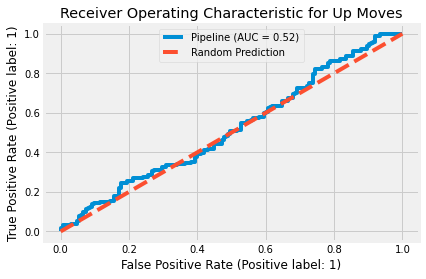

##Further Work

* We see from the ROC curve that the built model performs somewhat better than random predictions, except for ??
* More features could be tested to build the model.
* More values of threshold can be explored for defining the binary target variable.
* More combinations of hyper-parameters could be explored, using the other two implementations of SVM available in Scikit-Learn (i.e. SVC and LinearSVC)


#**IV. References**

https://scikit-learn.org/stable/modules/svm.html#shrinking-svm
https://scikit-learn.org/stable/modules/generated/sklearn.svm.NuSVC.html#sklearn.svm.NuSVC
https://en.wikipedia.org/wiki/Algorithmic_trading
https://www.investopedia.com/articles/active-trading/011815/top-technical-indicators-rookie-traders.asp
https://www.investopedia.com/articles/07/mean_reversion_martingale.asp
